In [ ]:
Tfrom google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import glob
import numpy as np
import random
import time
from tqdm import tqdm
import collections

import scipy
import scipy.io as io
from scipy.ndimage.filters import gaussian_filter
from matplotlib import pyplot as plt
from matplotlib import cm as CM

import cv2
import h5py
import PIL.Image as Image

import torch.nn as nn
import torch
from torchvision import models
from torch.utils.data import Dataset
from torchvision import transforms

<ipython-input-2-678dfc7251a7>:11: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter


In [ ]:
def gaussian_filter_density(img,points):

    img_shape=[img.shape[0],img.shape[1]]
    print("Shape of current image: ",img_shape,". Totally need generate ",len(points),"gaussian kernels.")
    density = np.zeros(img_shape, dtype=np.float32)
    gt_count = len(points)
    if gt_count == 0:
        return density

    leafsize = 2048
    tree = scipy.spatial.KDTree(points.copy(), leafsize=leafsize)
    distances, locations = tree.query(points, k=4)

    print ('generate density...')
    for i, pt in enumerate(points):
        pt2d = np.zeros(img_shape, dtype=np.float32)
        if int(pt[1])<img_shape[0] and int(pt[0])<img_shape[1]:
            pt2d[int(pt[1]),int(pt[0])] = 1.
        else:
            continue
        if gt_count > 1:
            sigma = (distances[i][1]+distances[i][2]+distances[i][3])*0.1
        else:
            sigma = np.average(np.array(gt.shape))/2./2.
        density += scipy.ndimage.filters.gaussian_filter(pt2d, sigma, mode='constant')
    print ('done.')
    return density


# test code
if __name__=="__main__":

    root = '/content/drive/MyDrive/reduced_part_B'
    print(f"Root directory: {root}")

    train = os.path.join(root,'train_data', 'images')
    test = os.path.join(root,'test_data', 'images')

    path_sets = [train, test]

    print(f"Paths: {path_sets}")
    print(len(glob.glob(os.path.join(train, '*.jpg'))))

    img_paths = []
    for path in path_sets:
        for img_path in glob.glob(os.path.join(path, '*.jpg')):
            img_paths.append(img_path)

    print(f"Total images: {len(img_paths)}")

    for img_path in img_paths:
        print(img_path)
        mat = io.loadmat(img_path.replace('.jpg','.mat').replace('images','ground-truth'))
        img= plt.imread(img_path)
        k = np.zeros((img.shape[0],img.shape[1]))
        points = mat["image_info"][0,0][0,0][0]
        k = gaussian_filter_density(img,points)
        np.save(img_path.replace('.jpg','.npy').replace('images','ground-truth'), k)

Root directory: /content/drive/MyDrive/reduced_part_B
Paths: ['/content/drive/MyDrive/reduced_part_B/train_data/images', '/content/drive/MyDrive/reduced_part_B/test_data/images']
100
Total images: 200
/content/drive/MyDrive/reduced_part_B/train_data/images/IMG_1.jpg
Shape of current image:  [768, 1024] . Totally need generate  233 gaussian kernels.
generate density...


<ipython-input-4-a4cc6f01adf4>:25: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  density += scipy.ndimage.filters.gaussian_filter(pt2d, sigma, mode='constant')


done.
/content/drive/MyDrive/reduced_part_B/train_data/images/IMG_10.jpg
Shape of current image:  [768, 1024] . Totally need generate  229 gaussian kernels.
generate density...
done.
/content/drive/MyDrive/reduced_part_B/train_data/images/IMG_12.jpg
Shape of current image:  [768, 1024] . Totally need generate  100 gaussian kernels.
generate density...
done.
/content/drive/MyDrive/reduced_part_B/train_data/images/IMG_100.jpg
Shape of current image:  [768, 1024] . Totally need generate  206 gaussian kernels.
generate density...
done.
/content/drive/MyDrive/reduced_part_B/train_data/images/IMG_13.jpg
Shape of current image:  [768, 1024] . Totally need generate  117 gaussian kernels.
generate density...
done.
/content/drive/MyDrive/reduced_part_B/train_data/images/IMG_11.jpg
Shape of current image:  [768, 1024] . Totally need generate  139 gaussian kernels.
generate density...
done.
/content/drive/MyDrive/reduced_part_B/train_data/images/IMG_17.jpg
Shape of current image:  [768, 1024] . To

In [ ]:
class CANNet(nn.Module):

    def __init__(self, load_weights=False):
        super(CANNet,self).__init__()
        self.frontend_feat=[64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512]
        self.backend_feat=[512, 512, 512,256,128,64]
        self.frontend = make_layers(self.frontend_feat)
        self.backend = make_layers(self.backend_feat,in_channels = 1024,dilation = True)
        self.output_layer = nn.Conv2d(64, 1, kernel_size=1)
        self.conv1_1=nn.Conv2d(512,512,kernel_size=1,bias=False)
        self.conv1_2=nn.Conv2d(512,512,kernel_size=1,bias=False)
        self.conv2_1=nn.Conv2d(512,512,kernel_size=1,bias=False)
        self.conv2_2=nn.Conv2d(512,512,kernel_size=1,bias=False)
        self.conv3_1=nn.Conv2d(512,512,kernel_size=1,bias=False)
        self.conv3_2=nn.Conv2d(512,512,kernel_size=1,bias=False)
        self.conv6_1=nn.Conv2d(512,512,kernel_size=1,bias=False)
        self.conv6_2=nn.Conv2d(512,512,kernel_size=1,bias=False)
        if not load_weights:
            mod = models.vgg16(pretrained = True)
            self._initialize_weights()
            fsd=collections.OrderedDict()
            for i in range(len(self.frontend.state_dict().items())):
                temp_key=list(self.frontend.state_dict().items())[i][0]
                fsd[temp_key]=list(mod.state_dict().items())[i][1]
            self.frontend.load_state_dict(fsd)

    def forward(self,x):
        fv = self.frontend(x)
        #S=1
        ave1=nn.functional.adaptive_avg_pool2d(fv,(1,1))
        ave1=self.conv1_1(ave1)
#        ave1=nn.functional.relu(ave1)
        s1=nn.functional.interpolate(ave1,size=(fv.shape[2],fv.shape[3]),mode='bilinear')
        c1=s1-fv
        w1=self.conv1_2(c1)
        w1=nn.functional.sigmoid(w1)
        #S=2
        ave2=nn.functional.adaptive_avg_pool2d(fv,(2,2))
        ave2=self.conv2_1(ave2)
#        ave2=nn.functional.relu(ave2)
        s2=nn.functional.interpolate(ave2,size=(fv.shape[2],fv.shape[3]),mode='bilinear')
        c2=s2-fv
        w2=self.conv2_2(c2)
        w2=nn.functional.sigmoid(w2)
        #S=3
        ave3=nn.functional.adaptive_avg_pool2d(fv,(3,3))
        ave3=self.conv3_1(ave3)
#        ave3=nn.functional.relu(ave3)
        s3=nn.functional.interpolate(ave3,size=(fv.shape[2],fv.shape[3]),mode='bilinear')
        c3=s3-fv
        w3=self.conv3_2(c3)
        w3=nn.functional.sigmoid(w3)
        #S=6
        ave6=nn.functional.adaptive_avg_pool2d(fv,(6,6))
#        print('ave6',ave6.mean())
        ave6=self.conv6_1(ave6)
#        ave6=nn.functional.relu(ave6)
        s6=nn.functional.interpolate(ave6,size=(fv.shape[2],fv.shape[3]),mode='bilinear')
        c6=s6-fv

        w6=self.conv6_2(c6)
        w6=nn.functional.sigmoid(w6)

        fi=(w1*s1+w2*s2+w3*s3+w6*s6)/(w1+w2+w3+w6+0.000000000001)
        x=torch.cat((fv,fi),1)

        x = self.backend(x)
        x = self.output_layer(x)
        return x
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, std=0.01)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)


In [ ]:
def make_layers(cfg, in_channels = 3,batch_norm=False,dilation = False):
    if dilation:
        d_rate = 2
    else:
        d_rate = 1
    layers = []
    for v in cfg:
        if v == 'M':
            layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        else:
            conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=d_rate,dilation = d_rate)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = v
    return nn.Sequential(*layers)

In [ ]:
# testing
if __name__=="__main__":
    csrnet=CANNet().to('cuda')
    input_img=torch.ones((1,3,256,256)).to('cuda')
    out=csrnet(input_img)
    print(out.mean())

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:04<00:00, 115MB/s]


tensor(2.7450e-05, device='cuda:0', grad_fn=<MeanBackward0>)


In [ ]:
class CrowdDataset(Dataset):

    def __init__(self, img_root, gt_dmap_root, gt_downsample=1, phase='train'):

        self.img_root = img_root
        self.gt_dmap_root = gt_dmap_root
        self.gt_downsample = gt_downsample
        self.phase = phase

        self.img_names = [filename for filename in os.listdir(img_root)
                          if filename.startswith("IMG") and filename.endswith(".jpg")]
        self.n_samples = len(self.img_names)

        print(f"Found {self.n_samples} images in {img_root}")


    def __len__(self):
        return self.n_samples

    def __getitem__(self, index):
        assert index <= len(self), 'Index out of range error'
        img_name = self.img_names[index]
        img_path = os.path.join(self.img_root, img_name)
        gt_dmap_path = os.path.join(self.gt_dmap_root, img_name.replace('.jpg', '.npy'))

        img = plt.imread(img_path) / 255

        if len(img.shape) == 2:
            img = img[:, :, np.newaxis]
            img = np.concatenate((img, img, img), 2)

        gt_dmap = np.load(gt_dmap_path)

        if random.randint(0, 1) == 1 and self.phase == 'train':
            img = img[:, ::-1]
            gt_dmap = gt_dmap[:, ::-1]

        # Downsample if needed
        if self.gt_downsample > 1:
            ds_rows = int(img.shape[0] // self.gt_downsample)
            ds_cols = int(img.shape[1] // self.gt_downsample)
            img = cv2.resize(img, (ds_cols * self.gt_downsample, ds_rows * self.gt_downsample))
            img = img.transpose((2, 0, 1))
            gt_dmap = cv2.resize(gt_dmap, (ds_cols, ds_rows))
            gt_dmap = gt_dmap[np.newaxis, :, :] * self.gt_downsample * self.gt_downsample

        img_tensor = torch.tensor(img, dtype=torch.float)
        img_tensor = transforms.functional.normalize(img_tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        gt_dmap_tensor = torch.tensor(gt_dmap, dtype=torch.float)

        return img_tensor, gt_dmap_tensor


In [ ]:
# Test code
if __name__ == "__main__":
    img_root = "/content/drive/MyDrive/reduced_part_B/train_data/images"
    gt_dmap_root = "/content/drive/MyDrive/reduced_part_B/train_data/ground-truth"
    dataset = CrowdDataset(img_root, gt_dmap_root, gt_downsample=8)

    for i, (img, gt_dmap) in enumerate(dataset):
        print(f"Image shape: {img.shape}, Density map shape: {gt_dmap.shape}")
        print(f"Image min/max: {img.min()}/{img.max()}, Density map min/max: {gt_dmap.min()}/{gt_dmap.max()}")
        break

Found 100 images in /content/drive/MyDrive/reduced_part_B/train_data/images
Image shape: torch.Size([3, 768, 1024]), Density map shape: torch.Size([1, 96, 128])
Image min/max: -2.1179039478302/2.640000104904175, Density map min/max: 0.0/0.27018582820892334


In [ ]:
# Configuration
TRAIN_IMAGE_ROOT = '/content/drive/MyDrive/reduced_part_B/train_data/images'
TRAIN_DMAP_ROOT = '/content/drive/MyDrive/reduced_part_B/train_data/ground-truth'
TEST_IMAGE_ROOT = '/content/drive/MyDrive/reduced_part_B/test_data/images'
TEST_DMAP_ROOT = '/content/drive/MyDrive/reduced_part_B/test_data/ground-truth'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
LR = 1e-6
BATCH_SIZE = 8
MOMENTUM = 0.95
EPOCHS = 40
SEED = int(time.time())
CHECKPOINT_DIR = './checkpoints'
PRINT_FREQ = 30

In [ ]:
def setup_seed(seed):
    torch.cuda.manual_seed(seed)
    random.seed(seed)
    np.random.seed(seed)

In [ ]:
def initialize_model():
    model = CANNet().to(DEVICE)
    criterion = nn.MSELoss(reduction='sum').to(DEVICE)
    optimizer = torch.optim.Adam(model.parameters(), lr=LR, betas=(0.9, 0.999), weight_decay=0)
    return model, criterion, optimizer

In [ ]:
def prepare_data():
    train_dataset = CrowdDataset(TRAIN_IMAGE_ROOT, TRAIN_DMAP_ROOT, gt_downsample=8, phase='train')
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    test_dataset = CrowdDataset(TEST_IMAGE_ROOT, TEST_DMAP_ROOT, gt_downsample=8, phase='test')
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)
    return train_loader, test_loader

In [ ]:
def train_one_epoch(model, train_loader, criterion, optimizer):
    model.train()
    epoch_loss = 0
    for img, gt_dmap in tqdm(train_loader, desc="Training"):
        img, gt_dmap = img.to(DEVICE), gt_dmap.to(DEVICE)
        et_dmap = model(img)
        loss = criterion(et_dmap, gt_dmap)
        epoch_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    return epoch_loss / len(train_loader)

In [ ]:
def evaluate(model, test_loader):
    model.eval()
    mae = 0
    with torch.no_grad():
        for img, gt_dmap in tqdm(test_loader, desc="Testing"):
            img, gt_dmap = img.to(DEVICE), gt_dmap.to(DEVICE)
            et_dmap = model(img)
            mae += abs(et_dmap.data.sum() - gt_dmap.data.sum()).item()
    return mae / len(test_loader)

In [ ]:
def plot_metrics(epoch_list, train_loss_list, test_error_list):
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epoch_list, train_loss_list, label='Train Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epoch_list, test_error_list, label='Test MAE', color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('Mean Absolute Error')
    plt.title('Test Error')
    plt.legend()
    plt.show()

In [ ]:
def display_sample(model, test_dataset):
    index = random.randint(0, len(test_dataset) - 1)
    img, gt_dmap = test_dataset[index]
    img_np = img.permute(1, 2, 0).cpu().numpy()
    gt_dmap_np = gt_dmap.squeeze(0).cpu().numpy()
    img = img.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        et_dmap = model(img)
    et_dmap_np = et_dmap.squeeze(0).squeeze(0).cpu().numpy()

    plt.figure(figsize=(12, 4))
    #for input img
    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.title('Input Image')
    #for ground truth dmap
    plt.subplot(1, 3, 2)
    plt.imshow(gt_dmap_np, cmap='hot')
    plt.title(f'Ground Truth DMap (Sum: {gt_dmap.sum():.2f})')
    #for estimated dmap
    plt.subplot(1, 3, 3)
    plt.imshow(et_dmap_np, cmap='hot')
    plt.title(f'Estimated DMap (Sum: {et_dmap.sum().item():.2f})')
    plt.show()

In [ ]:
def save_checkpoint(model, epoch):
    if not os.path.exists(CHECKPOINT_DIR):
        os.makedirs(CHECKPOINT_DIR)
    torch.save(model.state_dict(), os.path.join(CHECKPOINT_DIR, f'epoch_{epoch}.pth'))

Found 100 images in /content/drive/MyDrive/reduced_part_B/train_data/images
Found 100 images in /content/drive/MyDrive/reduced_part_B/test_data/images


Testing: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Epoch: 0 | Train Loss: 49.96 | Test MAE: 124.73


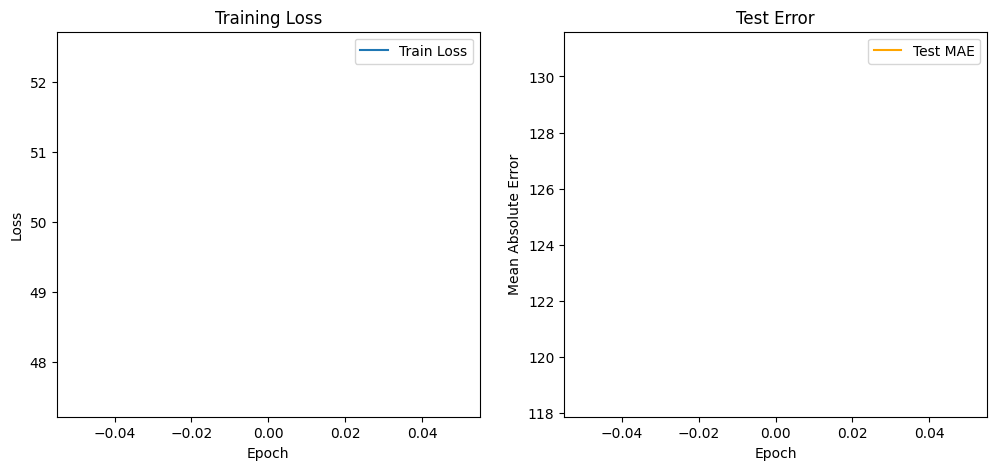

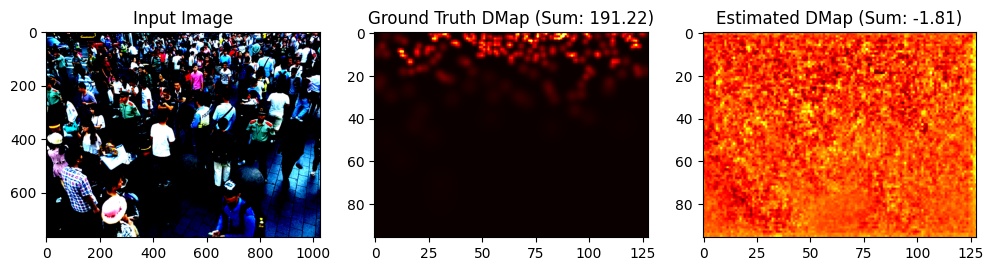

Testing: 100%|██████████| 100/100 [00:21<00:00,  4.62it/s]


Epoch: 1 | Train Loss: 49.80 | Test MAE: 116.68


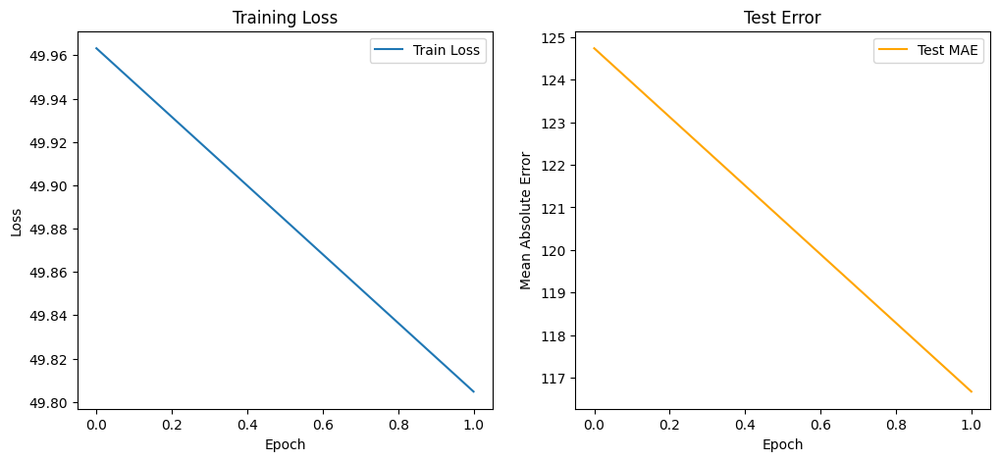

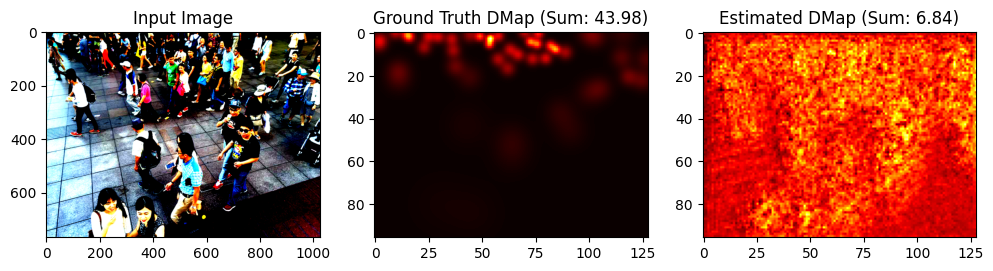

Testing: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Epoch: 2 | Train Loss: 49.61 | Test MAE: 106.65


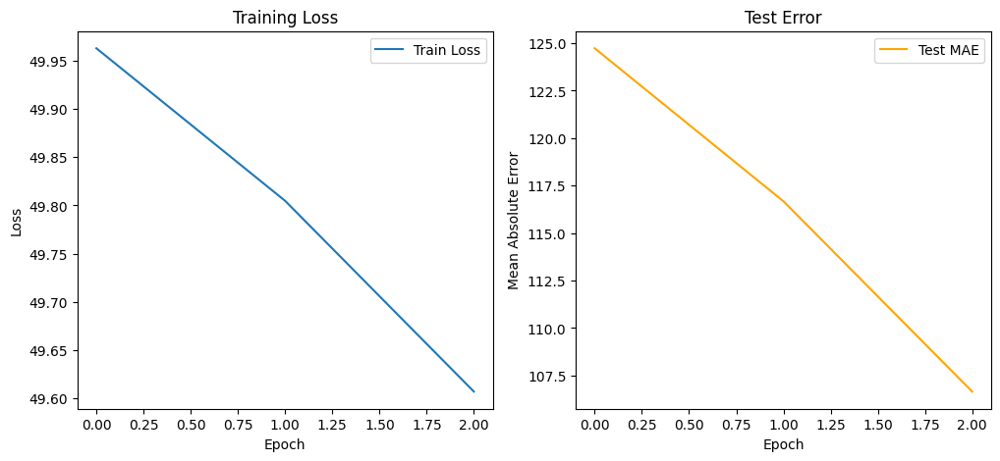

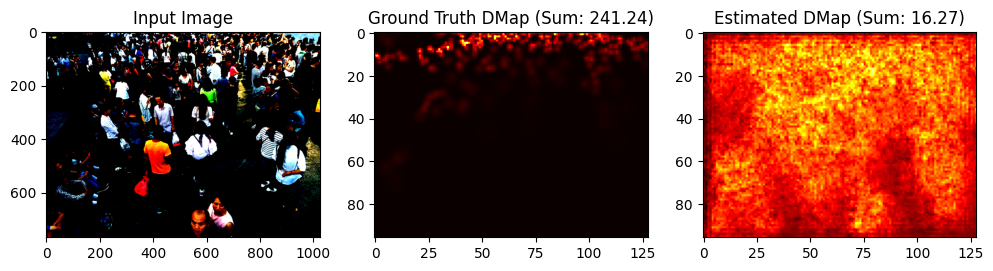

Testing: 100%|██████████| 100/100 [00:22<00:00,  4.47it/s]


Epoch: 3 | Train Loss: 49.36 | Test MAE: 94.46


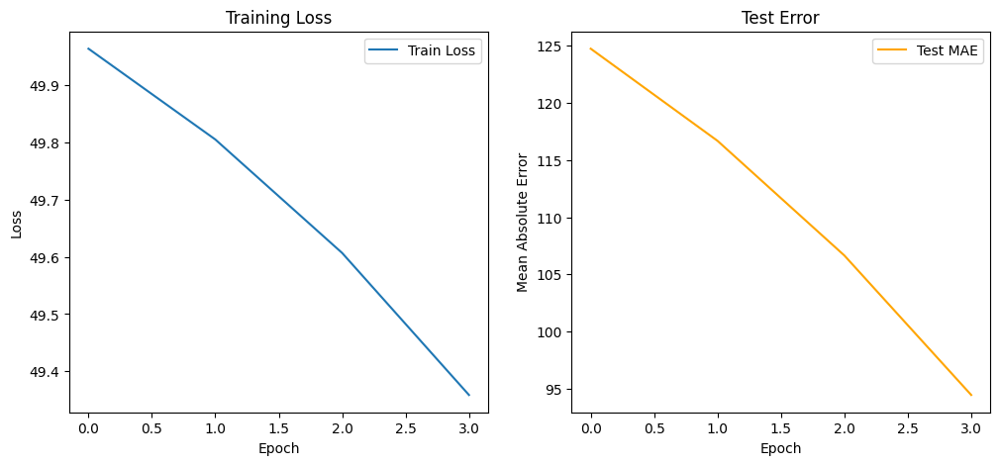

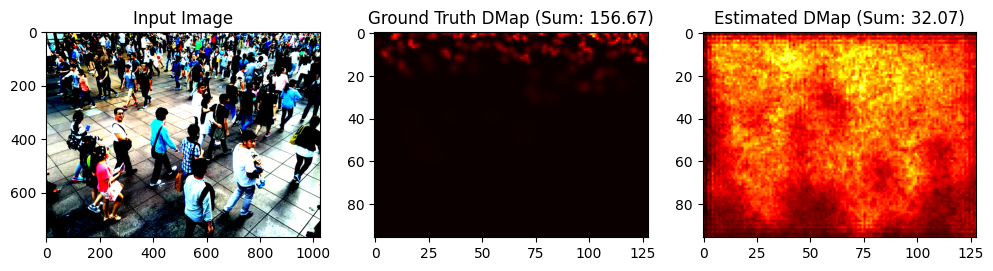

Testing: 100%|██████████| 100/100 [00:22<00:00,  4.45it/s]


Epoch: 4 | Train Loss: 49.08 | Test MAE: 82.40


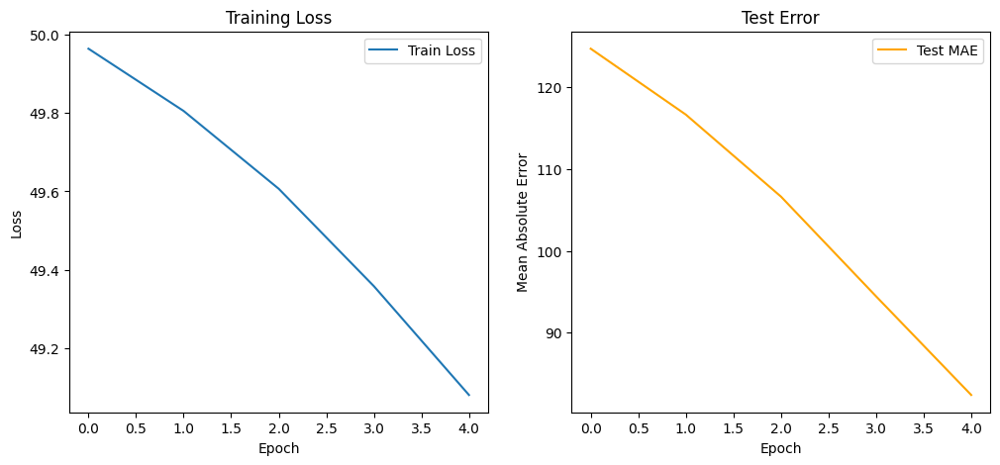

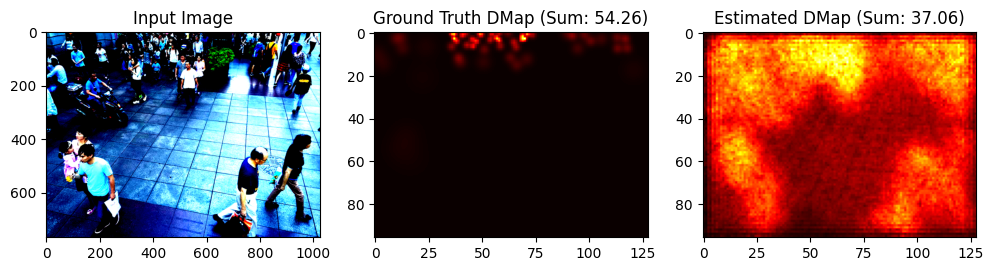

Testing: 100%|██████████| 100/100 [00:22<00:00,  4.48it/s]


Epoch: 5 | Train Loss: 48.79 | Test MAE: 73.97


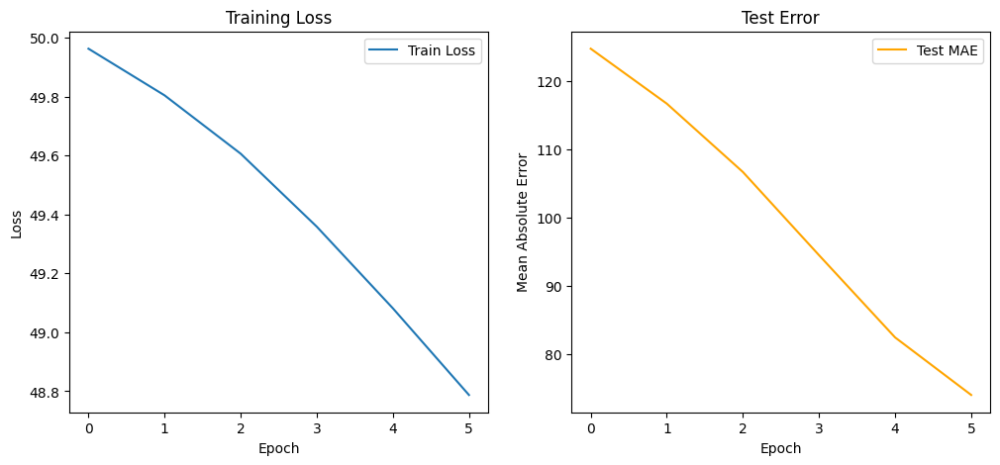

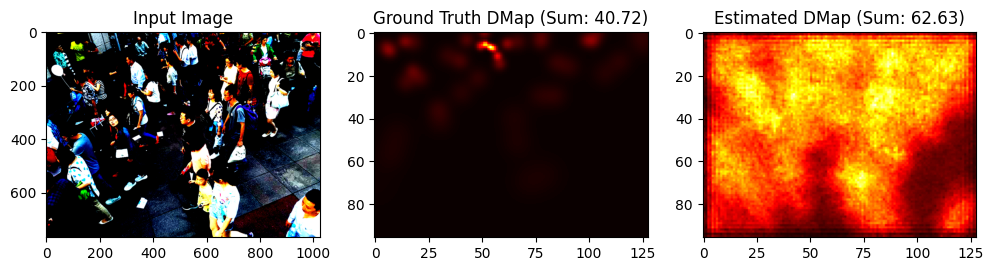

Testing: 100%|██████████| 100/100 [00:22<00:00,  4.47it/s]


Epoch: 6 | Train Loss: 48.50 | Test MAE: 69.50


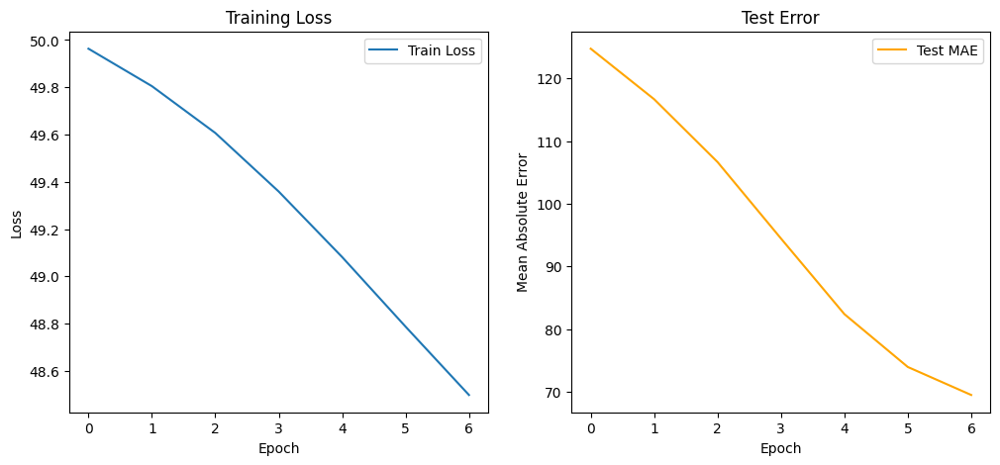

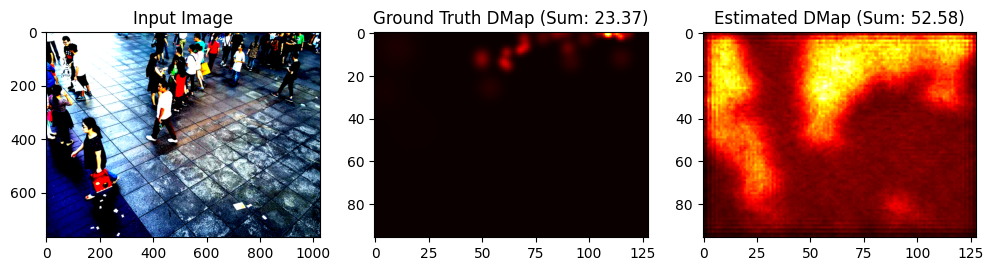

Testing: 100%|██████████| 100/100 [00:22<00:00,  4.38it/s]


Epoch: 7 | Train Loss: 48.21 | Test MAE: 68.19


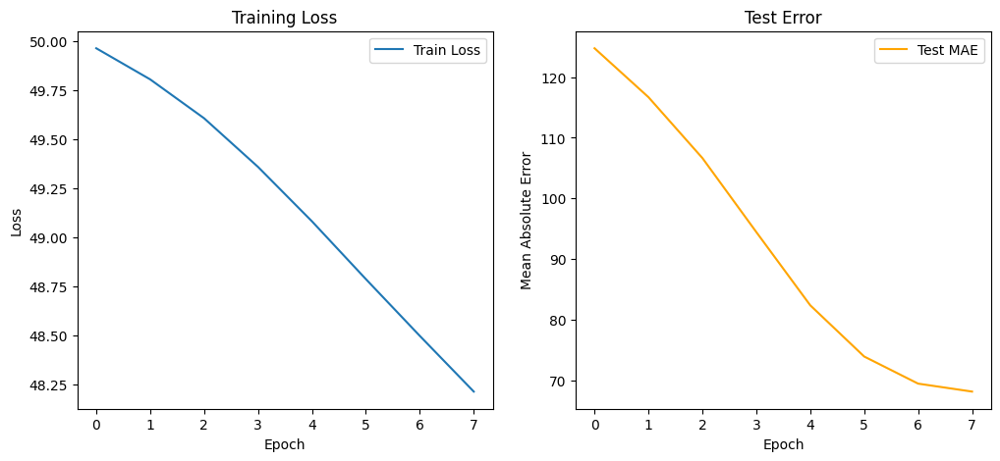

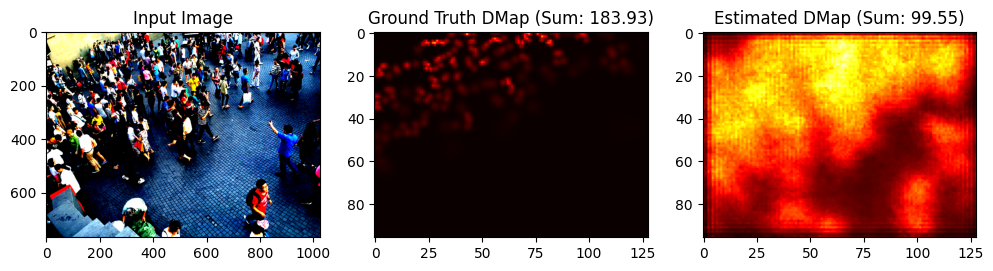

Testing: 100%|██████████| 100/100 [00:22<00:00,  4.37it/s]


Epoch: 8 | Train Loss: 47.95 | Test MAE: 69.52


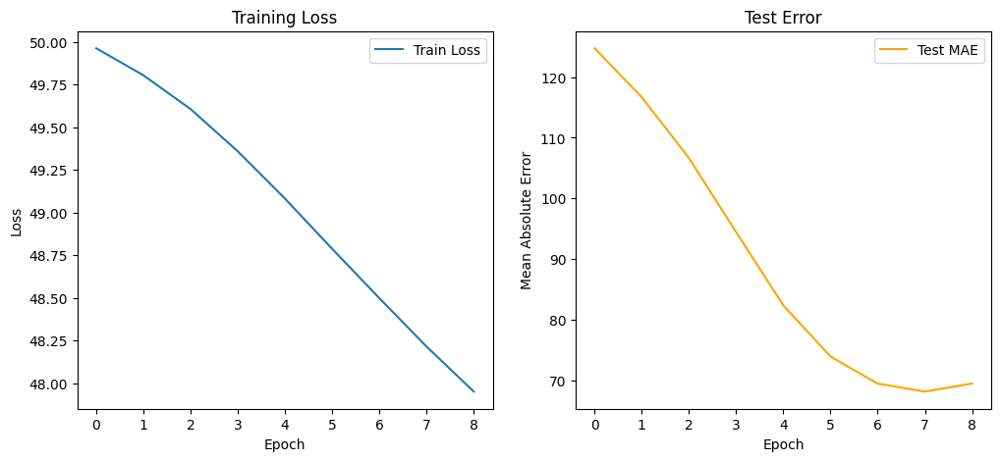

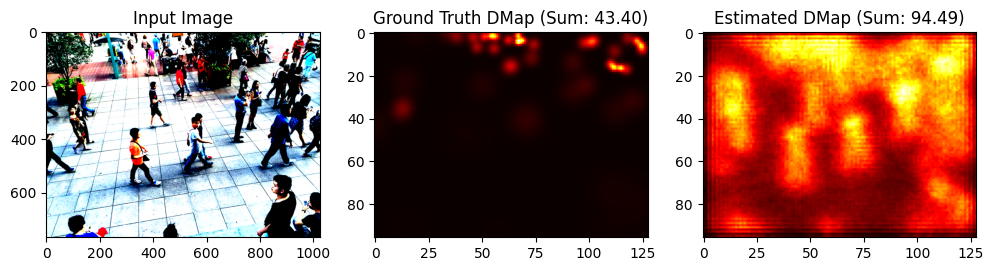

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.34it/s]


Epoch: 9 | Train Loss: 47.69 | Test MAE: 70.57


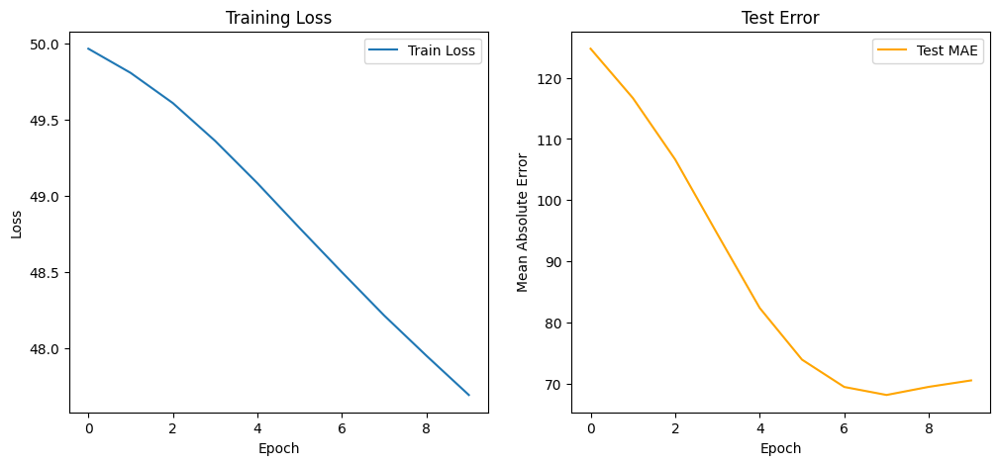

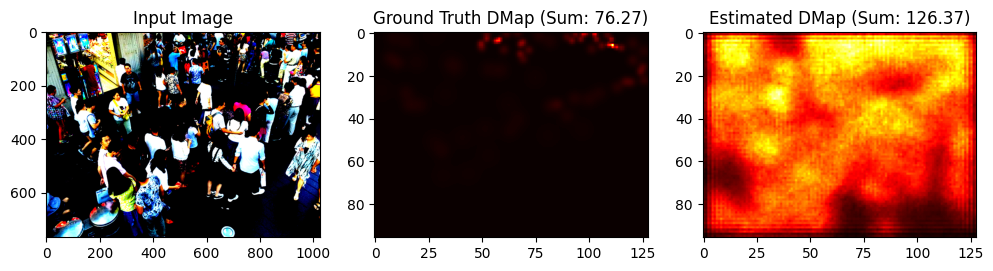

Testing: 100%|██████████| 100/100 [00:22<00:00,  4.39it/s]


Epoch: 10 | Train Loss: 47.44 | Test MAE: 71.36


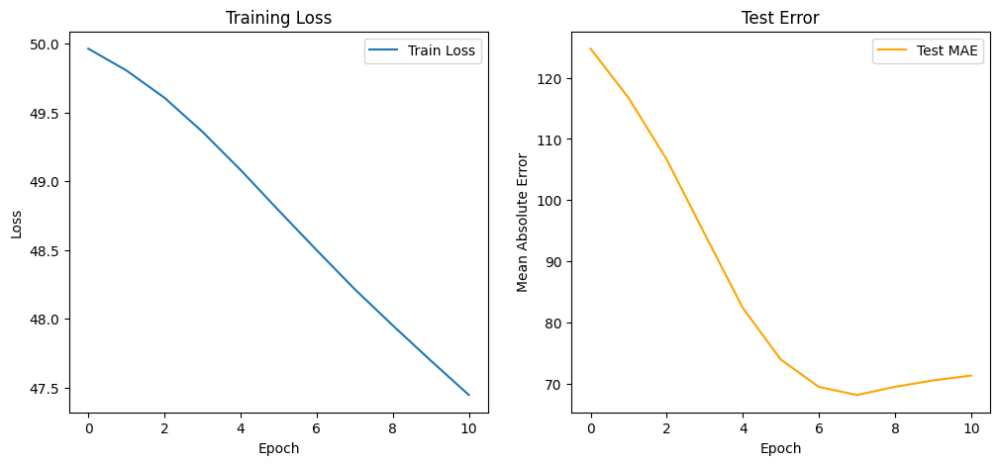

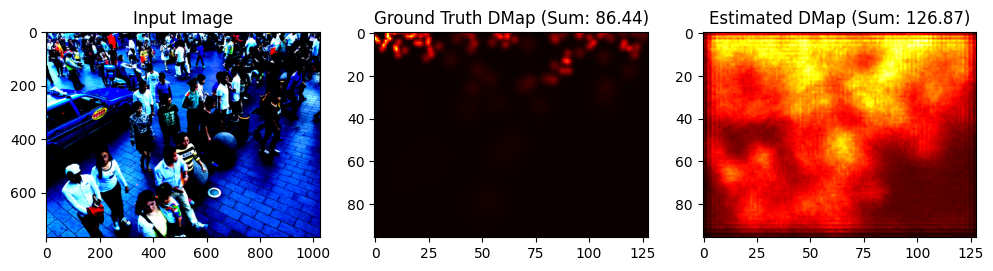

Testing: 100%|██████████| 100/100 [00:22<00:00,  4.36it/s]


Epoch: 11 | Train Loss: 47.18 | Test MAE: 71.59


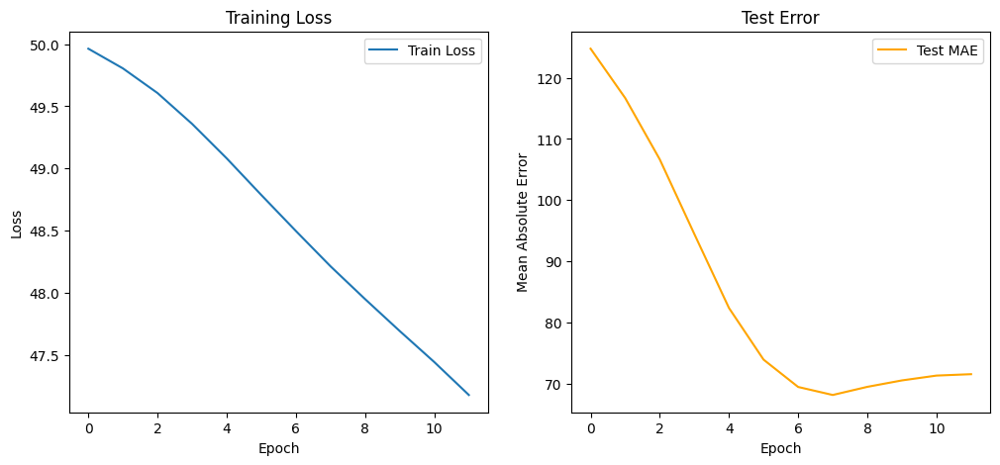

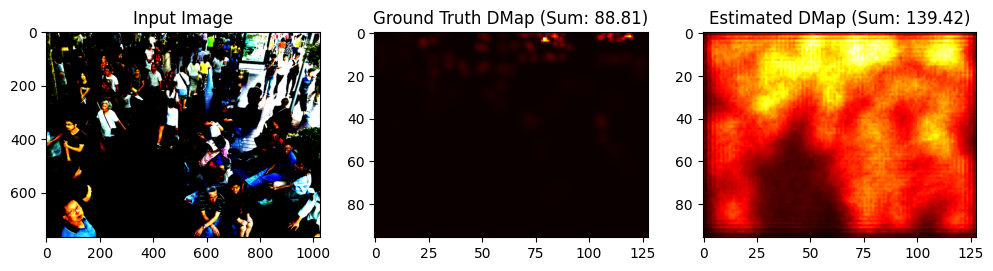

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.28it/s]


Epoch: 12 | Train Loss: 46.90 | Test MAE: 71.68


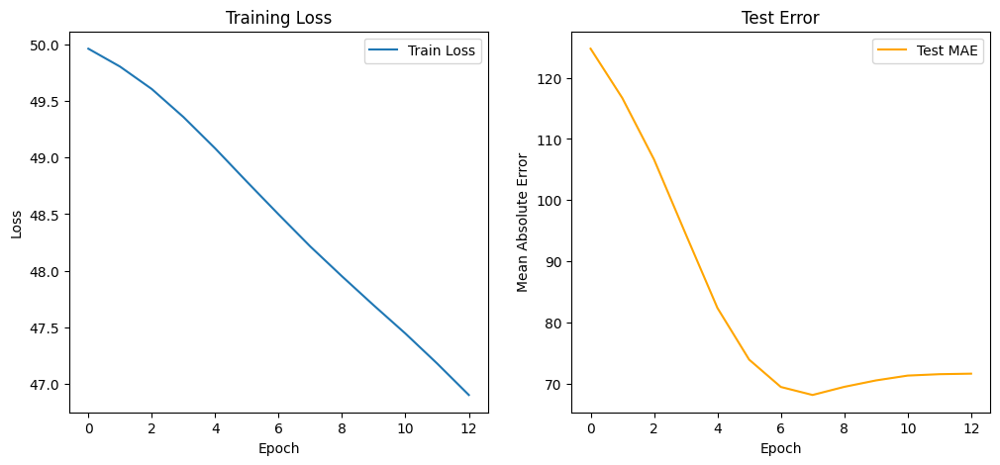

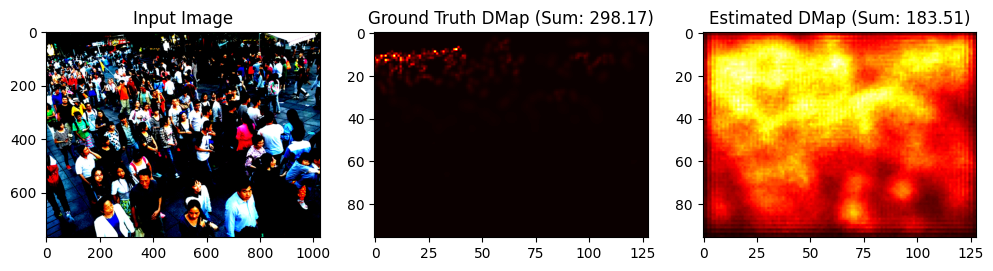

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.26it/s]


Epoch: 13 | Train Loss: 46.61 | Test MAE: 71.20


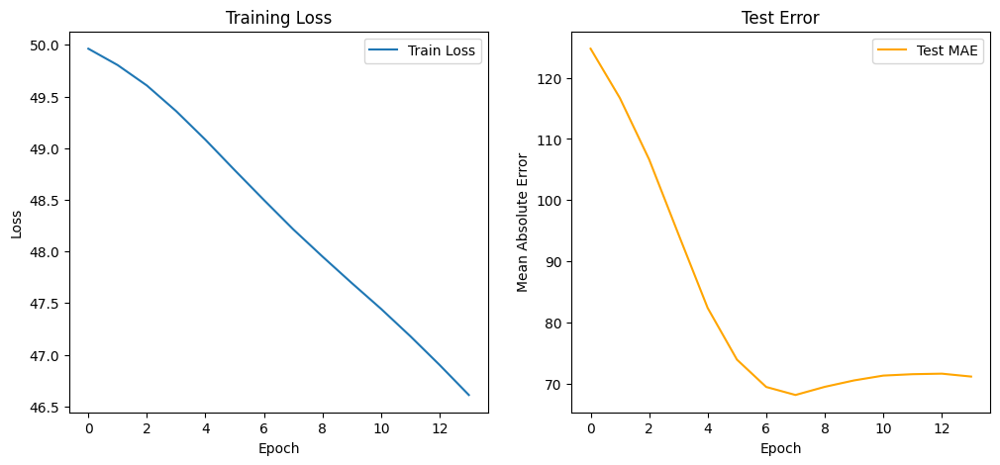

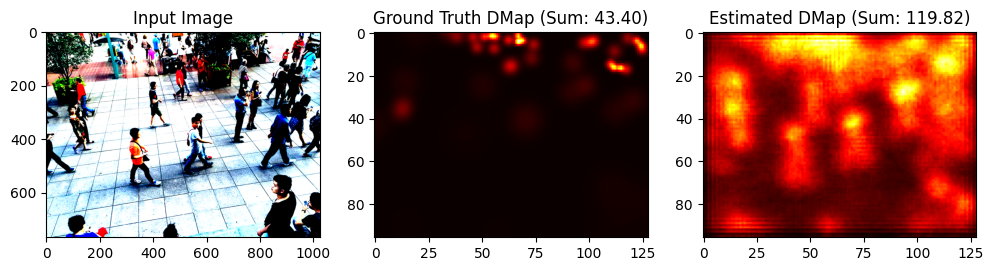

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.28it/s]


Epoch: 14 | Train Loss: 46.29 | Test MAE: 70.91


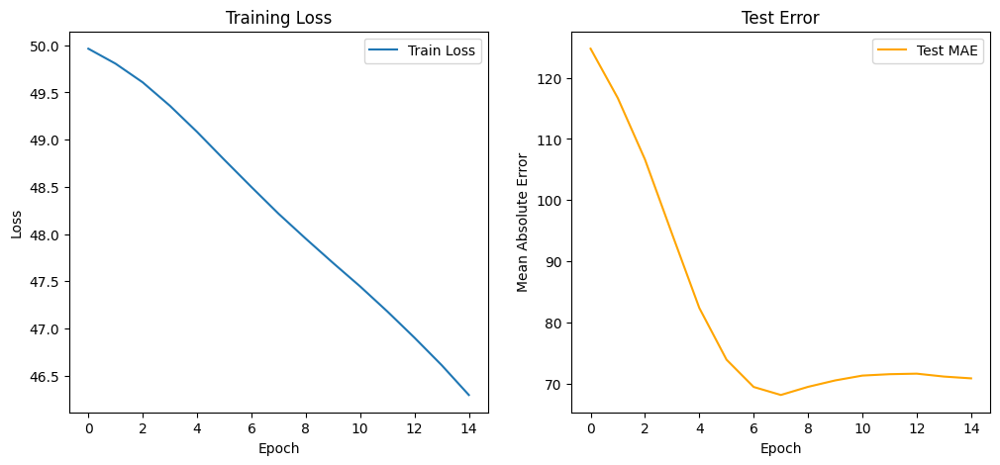

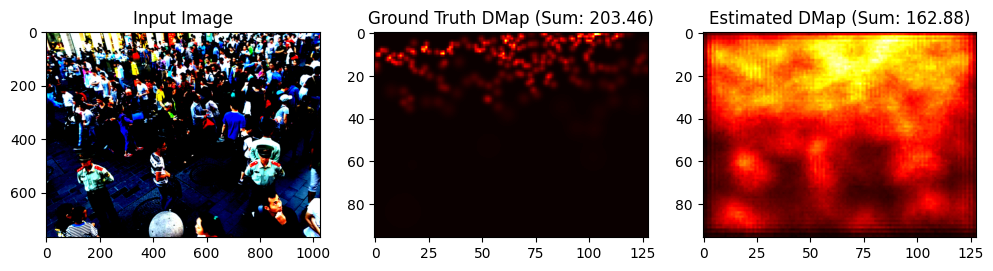

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.26it/s]


Epoch: 15 | Train Loss: 45.94 | Test MAE: 69.66


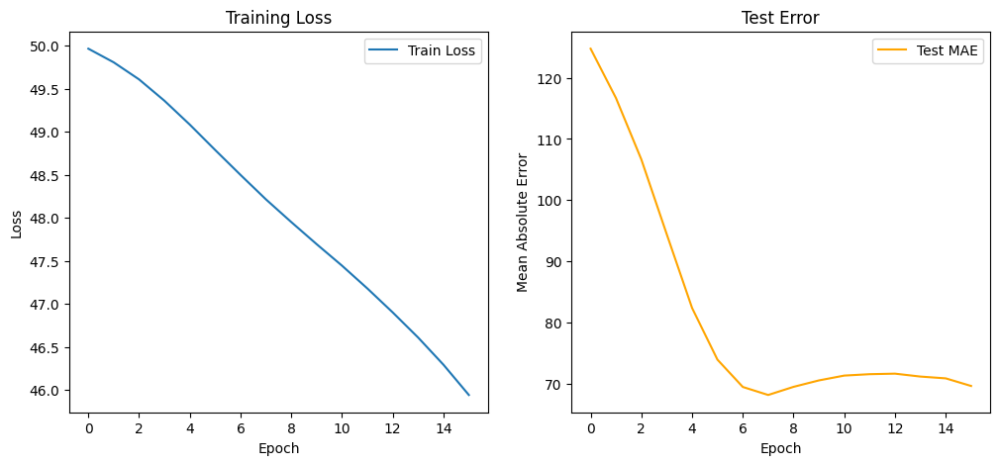

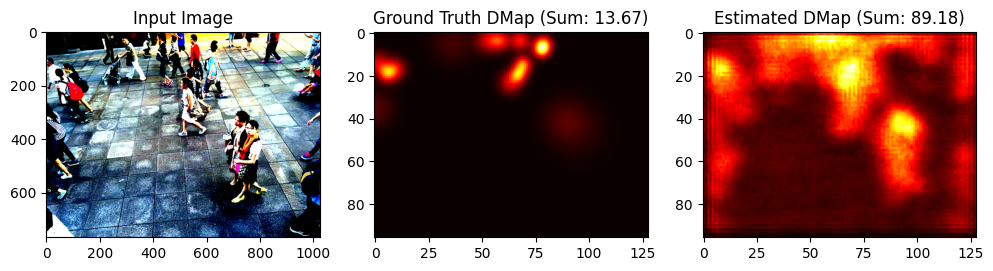

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.32it/s]


Epoch: 16 | Train Loss: 45.55 | Test MAE: 68.31


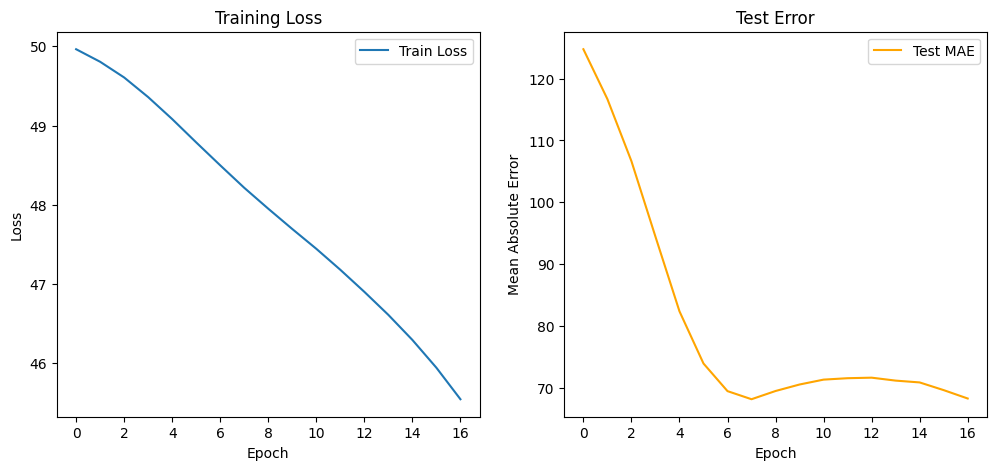

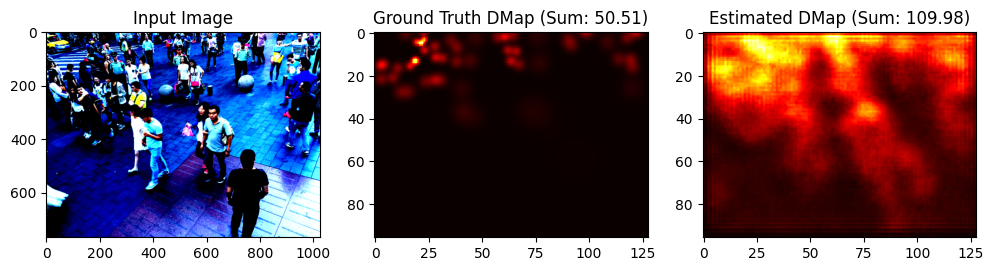

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.28it/s]


Epoch: 17 | Train Loss: 45.13 | Test MAE: 66.63


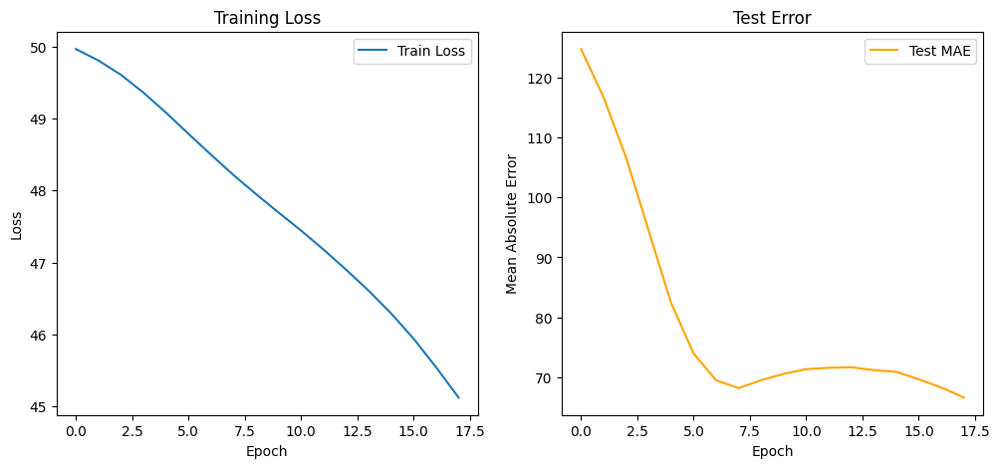

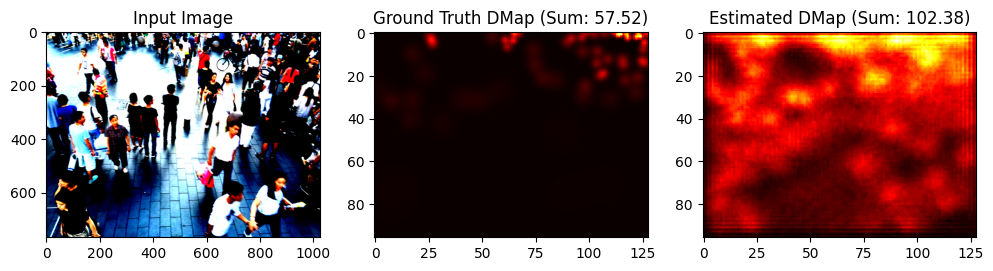

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.32it/s]


Epoch: 18 | Train Loss: 44.64 | Test MAE: 64.71


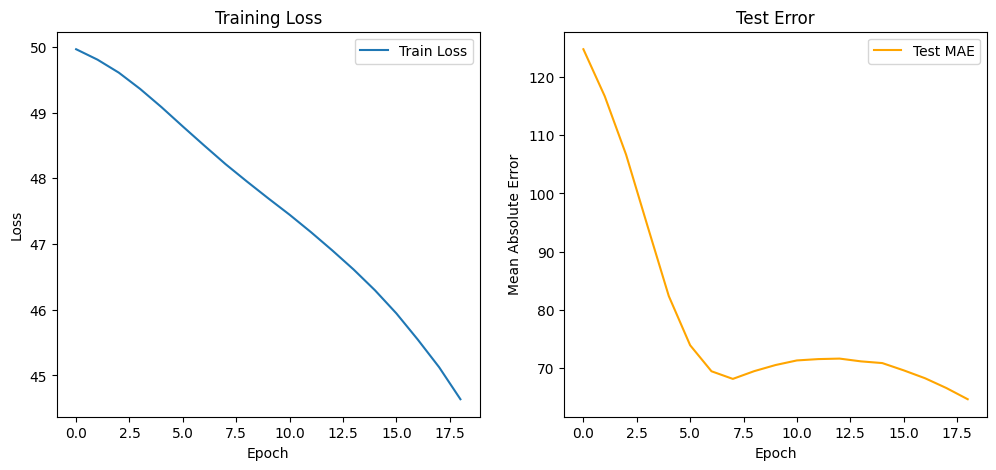

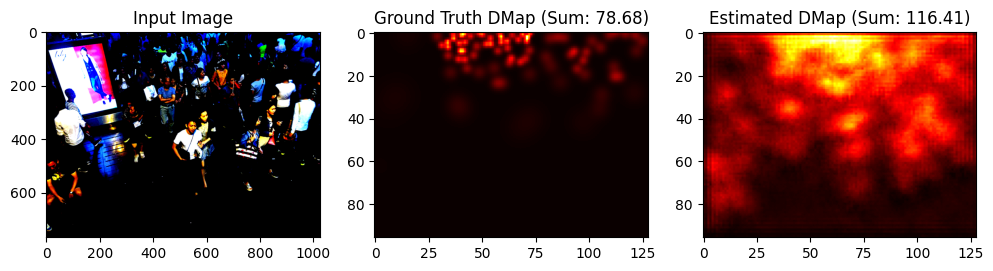

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.26it/s]


Epoch: 19 | Train Loss: 44.12 | Test MAE: 62.68


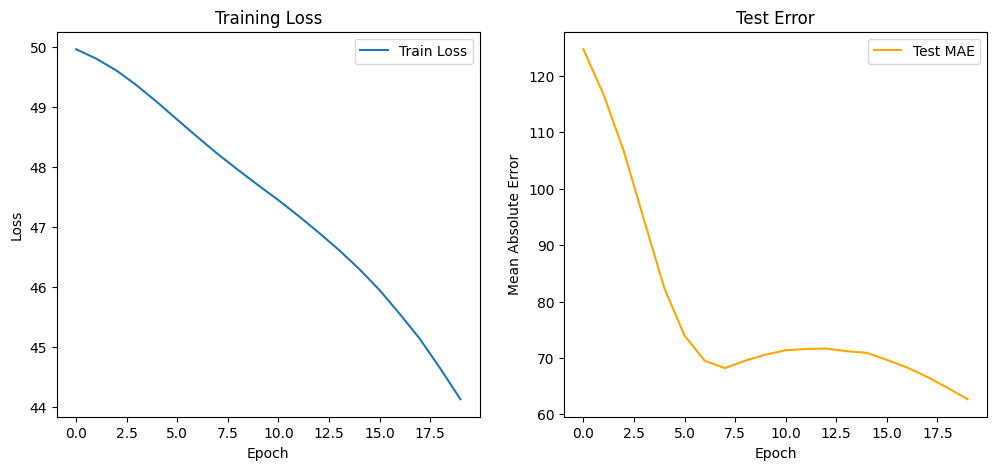

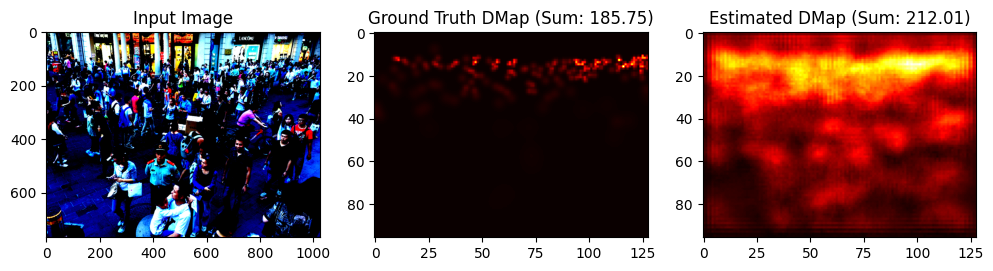

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.21it/s]


Epoch: 20 | Train Loss: 43.56 | Test MAE: 59.01


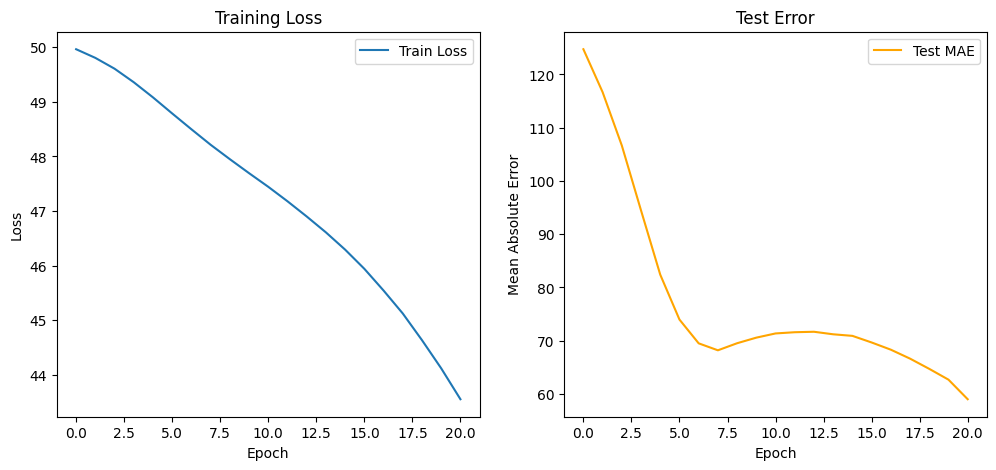

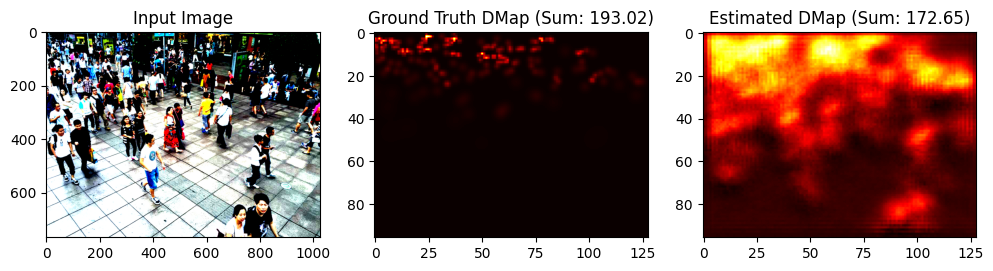

Testing: 100%|██████████| 100/100 [00:24<00:00,  4.16it/s]


Epoch: 21 | Train Loss: 42.97 | Test MAE: 55.36


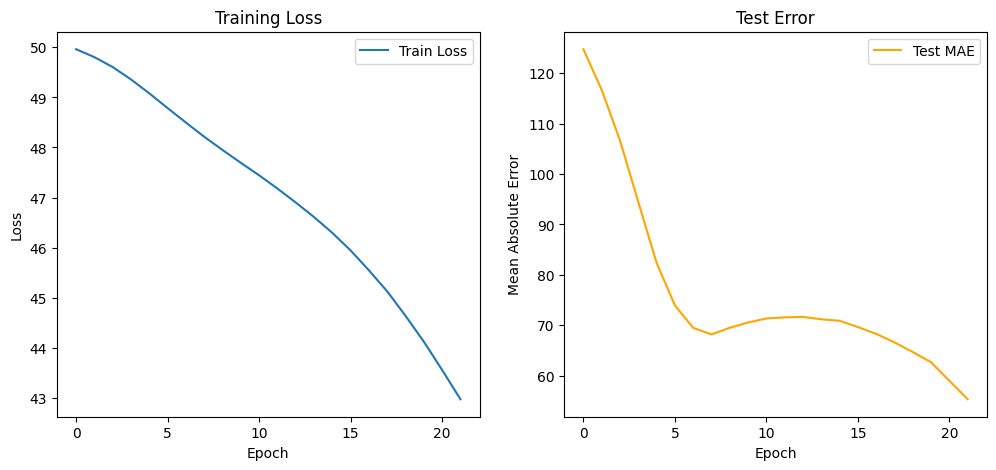

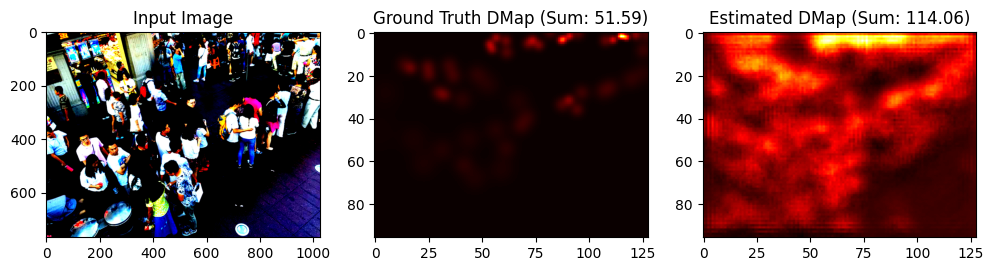

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.23it/s]


Epoch: 22 | Train Loss: 42.38 | Test MAE: 51.67


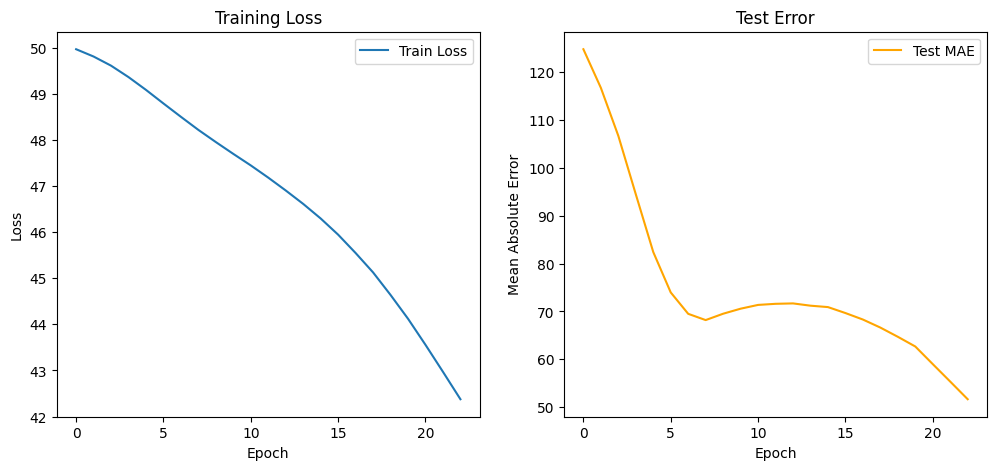

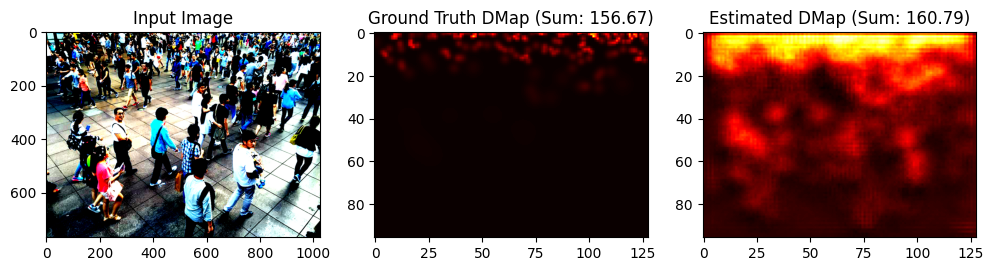

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.23it/s]


Epoch: 23 | Train Loss: 41.81 | Test MAE: 47.28


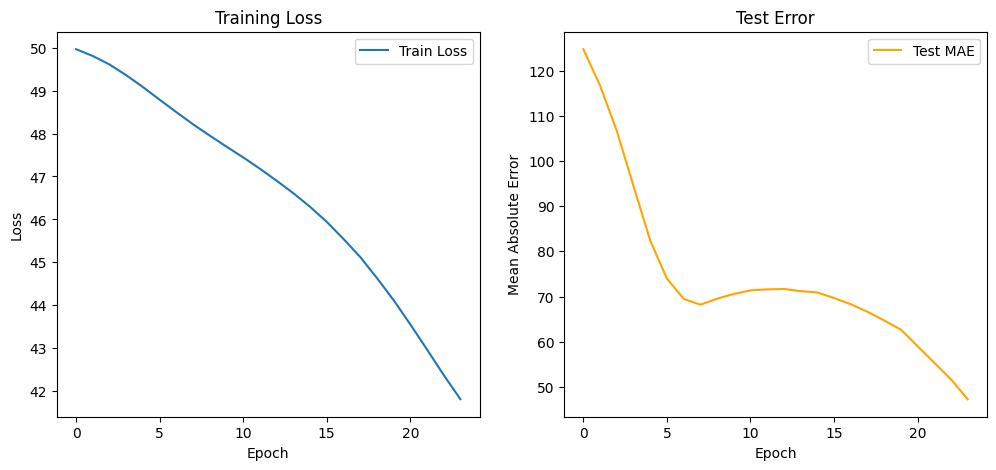

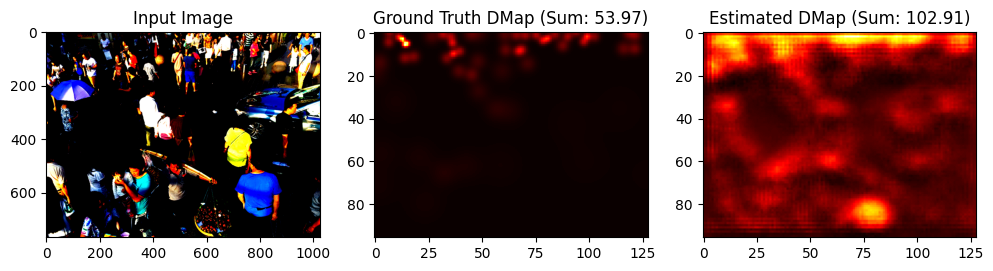

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.31it/s]


Epoch: 24 | Train Loss: 41.29 | Test MAE: 43.05


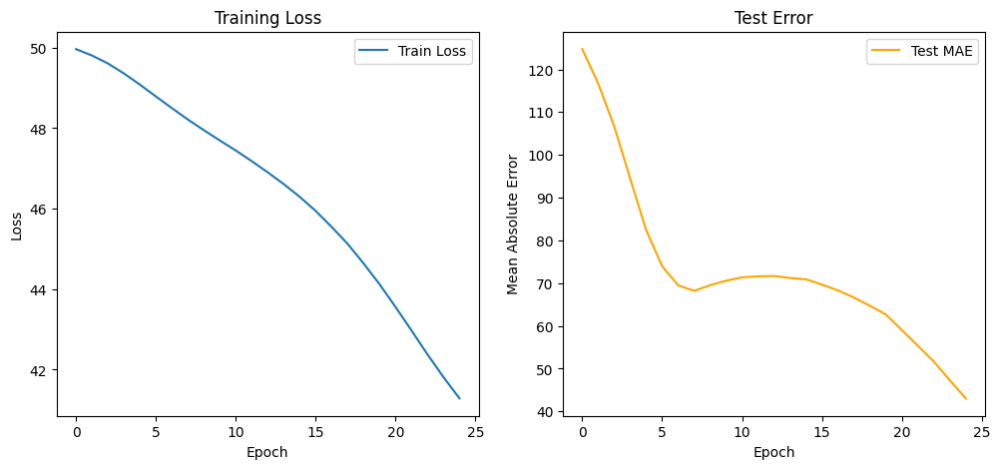

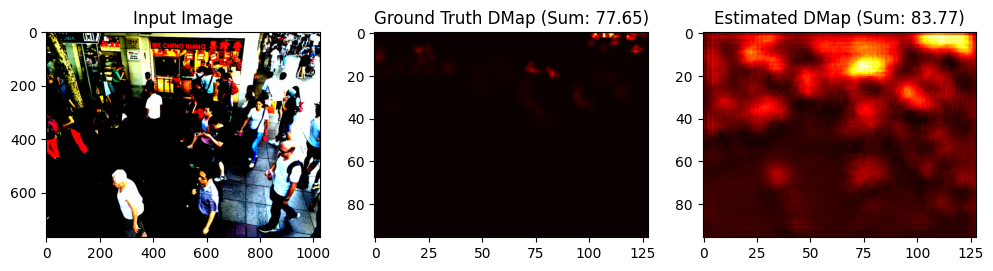

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.24it/s]


Epoch: 25 | Train Loss: 40.84 | Test MAE: 41.87


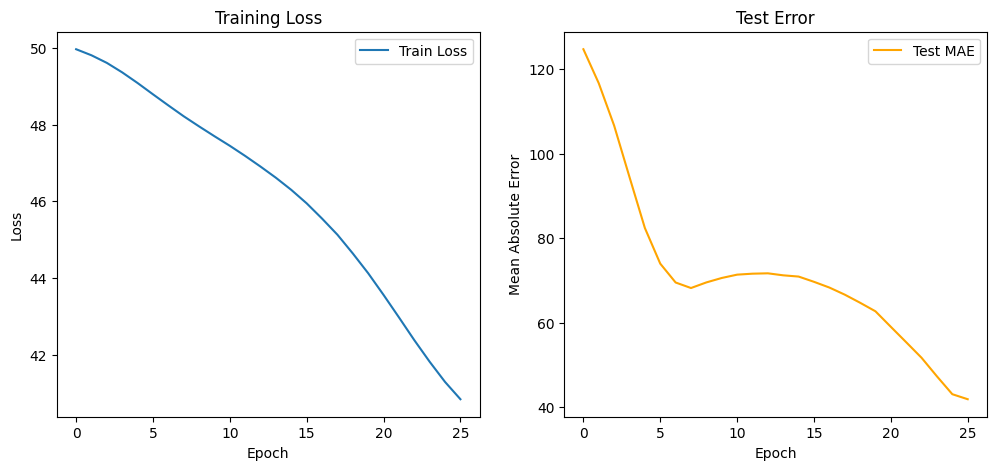

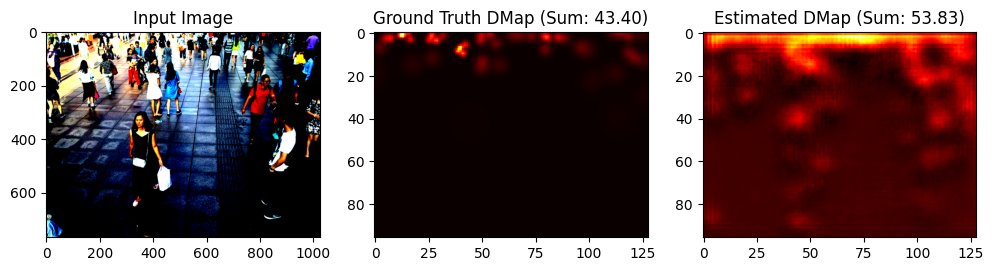

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.29it/s]


Epoch: 26 | Train Loss: 40.39 | Test MAE: 36.71


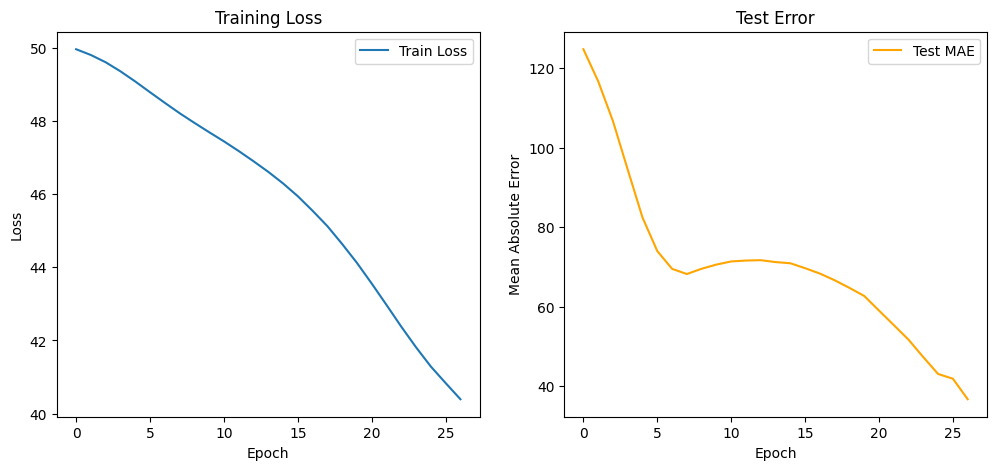

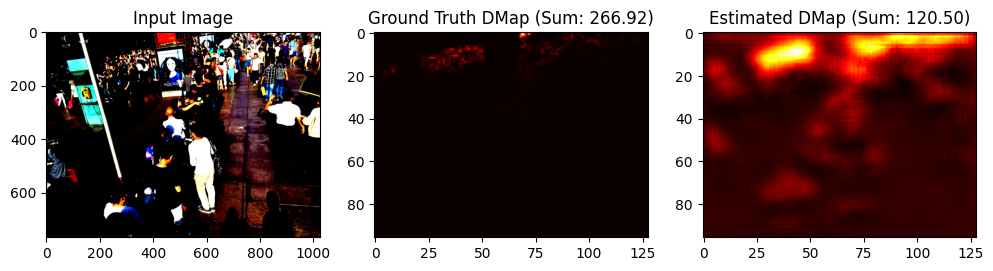

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.27it/s]


Epoch: 27 | Train Loss: 40.03 | Test MAE: 35.09


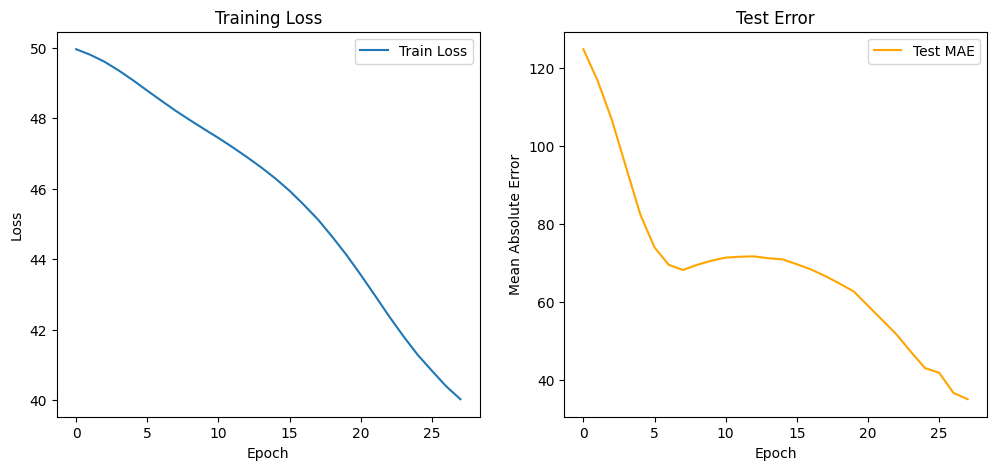

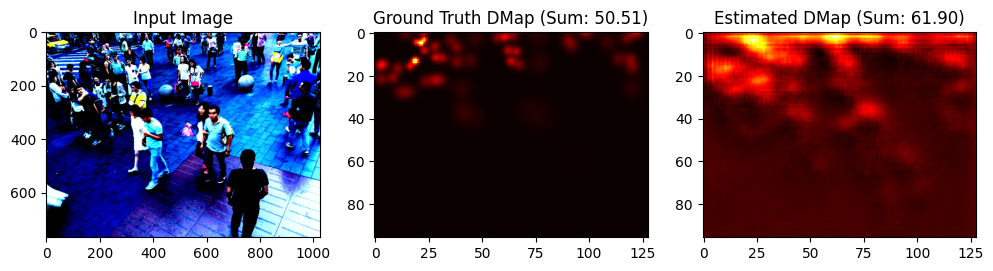

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.32it/s]


Epoch: 28 | Train Loss: 39.69 | Test MAE: 33.48


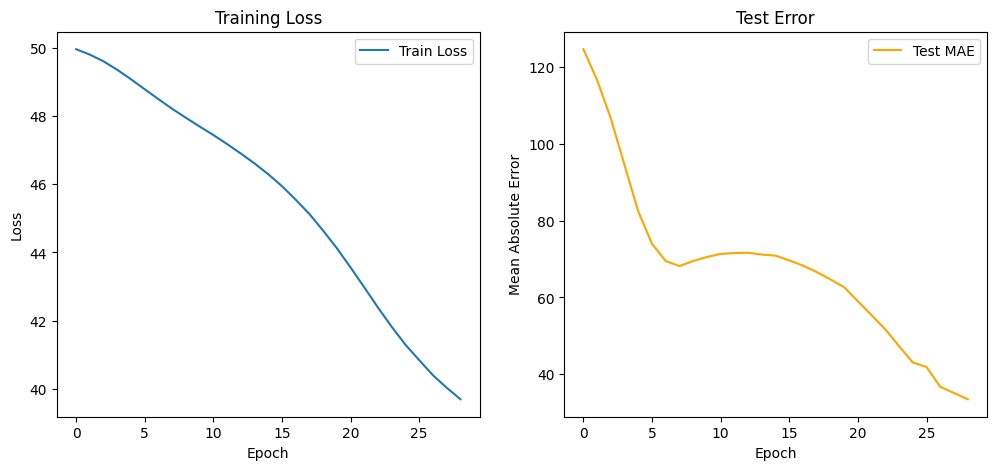

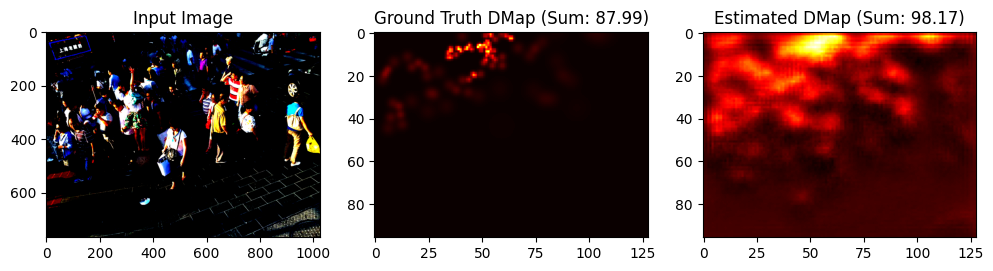

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.23it/s]


Epoch: 29 | Train Loss: 39.37 | Test MAE: 32.29


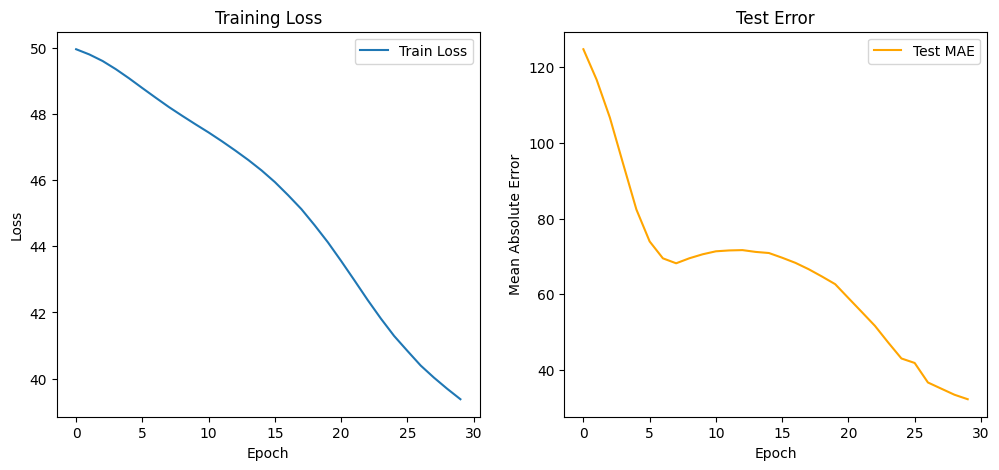

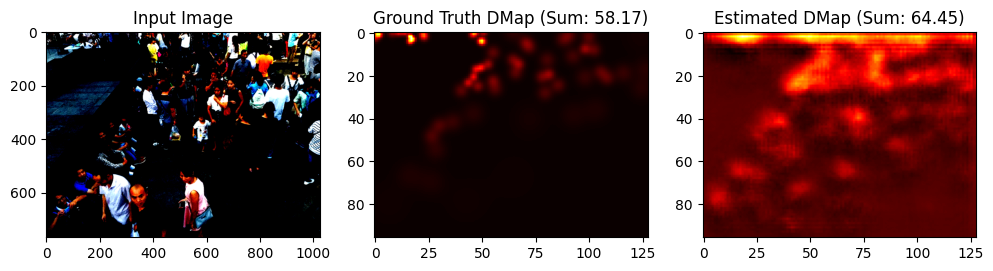

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.31it/s]


Epoch: 30 | Train Loss: 39.08 | Test MAE: 31.71


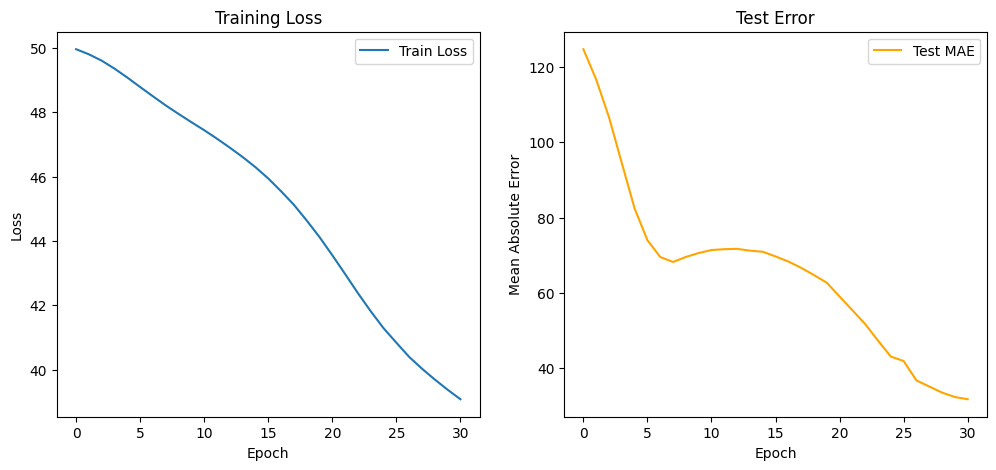

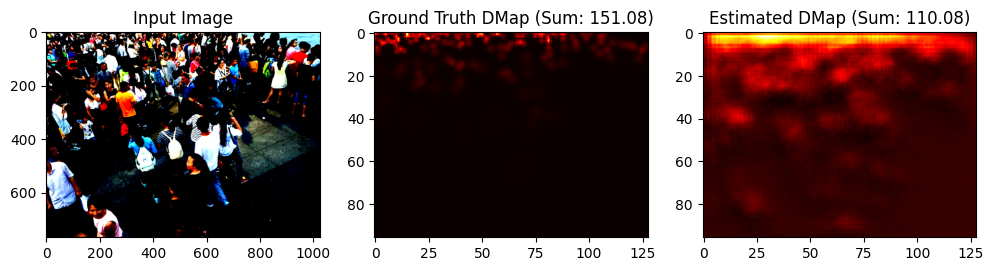

Testing: 100%|██████████| 100/100 [00:24<00:00,  4.13it/s]


Epoch: 31 | Train Loss: 38.80 | Test MAE: 31.07


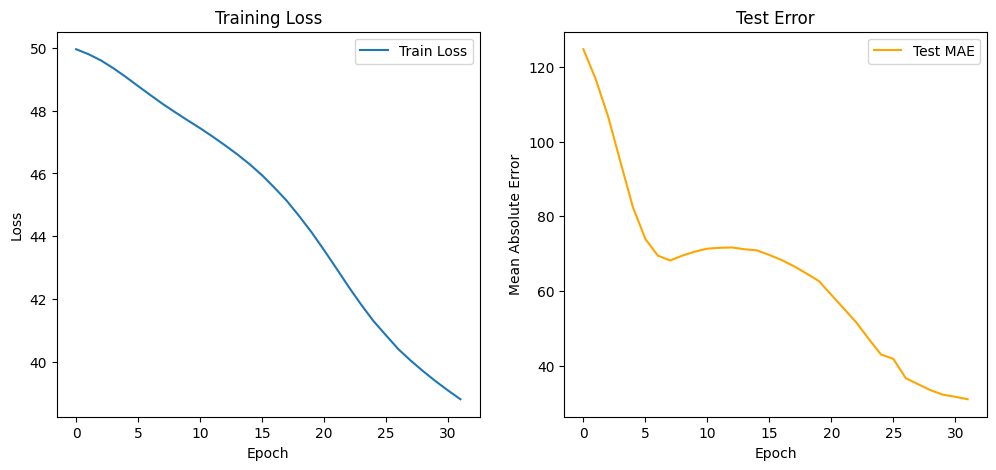

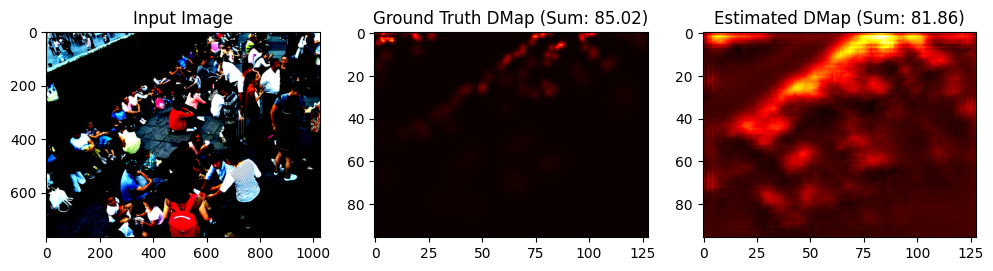

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.23it/s]


Epoch: 32 | Train Loss: 38.53 | Test MAE: 29.57


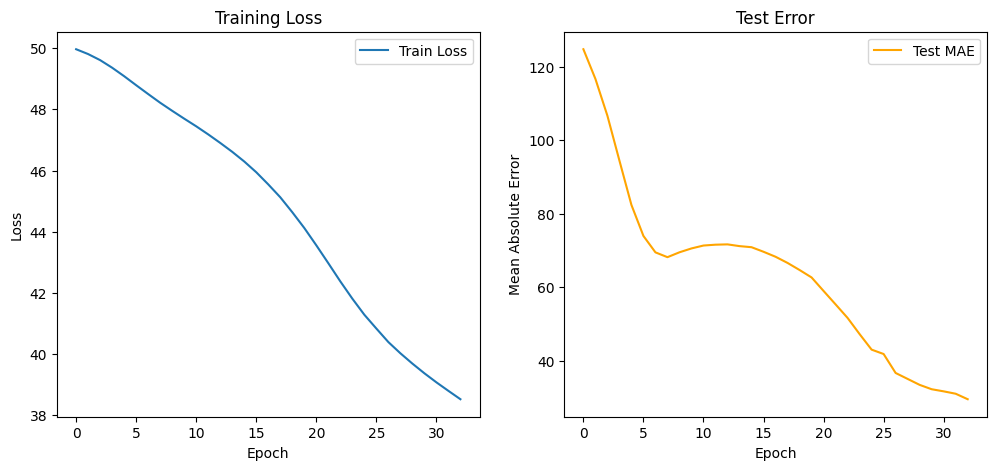

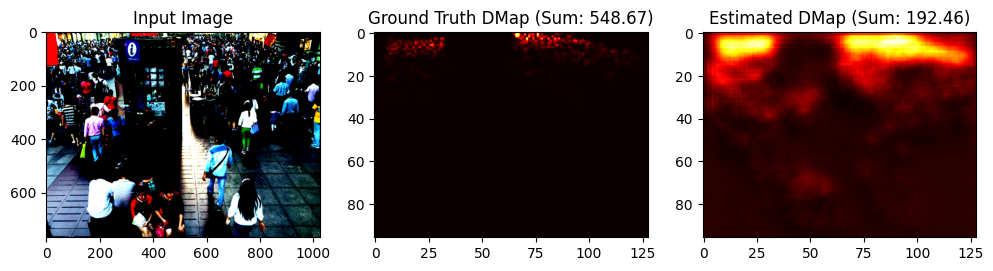

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.31it/s]


Epoch: 33 | Train Loss: 38.26 | Test MAE: 29.77


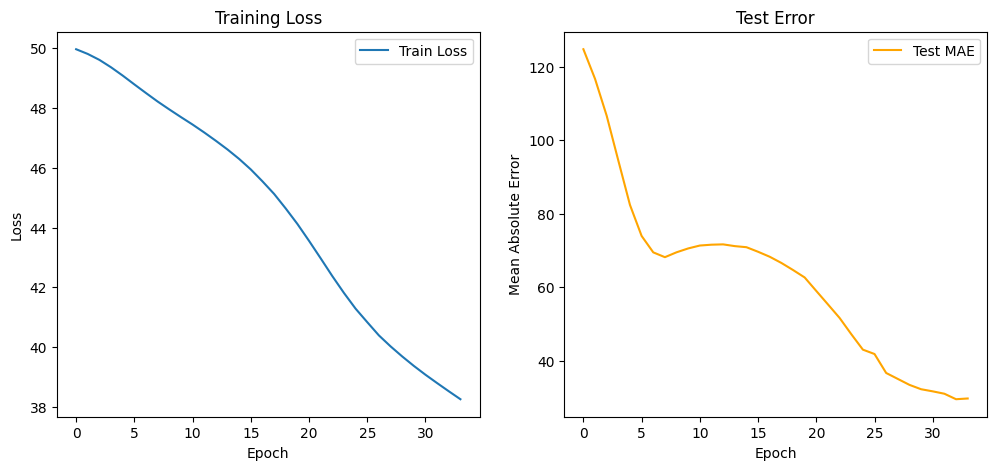

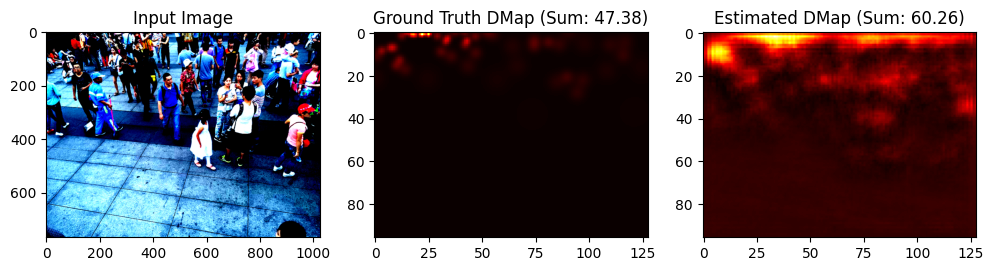

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.28it/s]


Epoch: 34 | Train Loss: 38.01 | Test MAE: 28.22


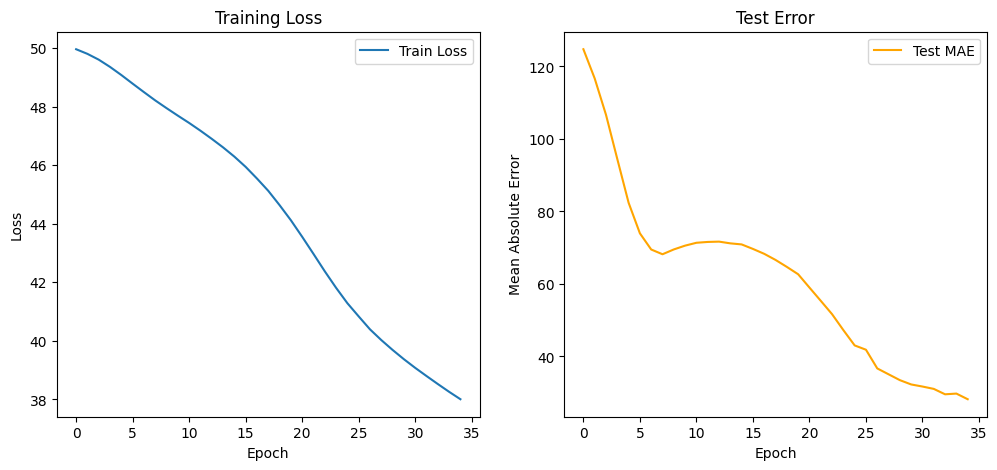

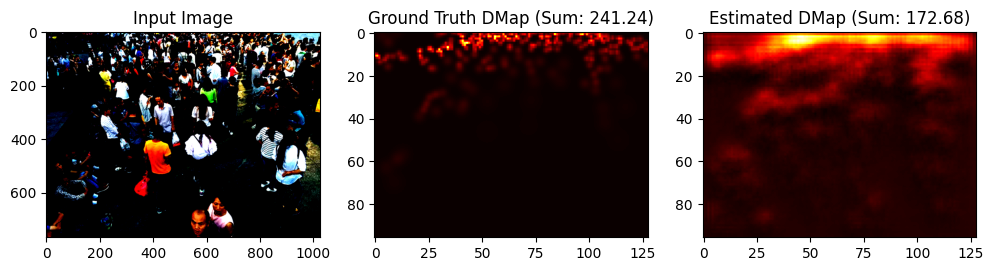

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.27it/s]


Epoch: 35 | Train Loss: 37.77 | Test MAE: 28.56


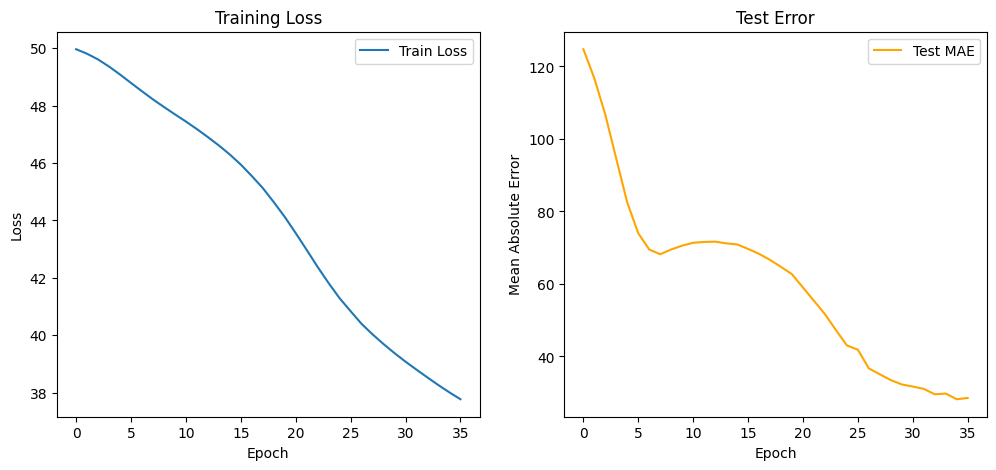

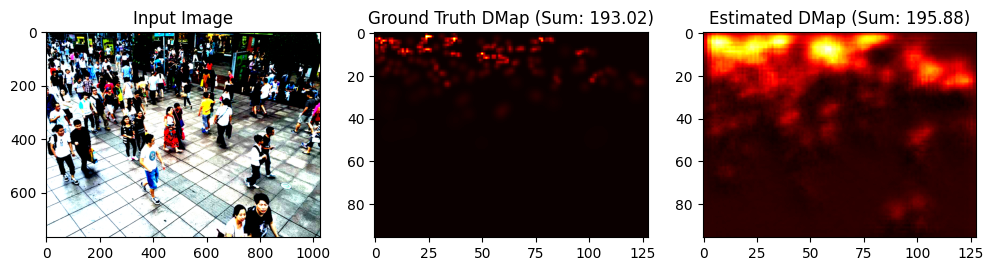

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.31it/s]


Epoch: 36 | Train Loss: 37.54 | Test MAE: 27.47


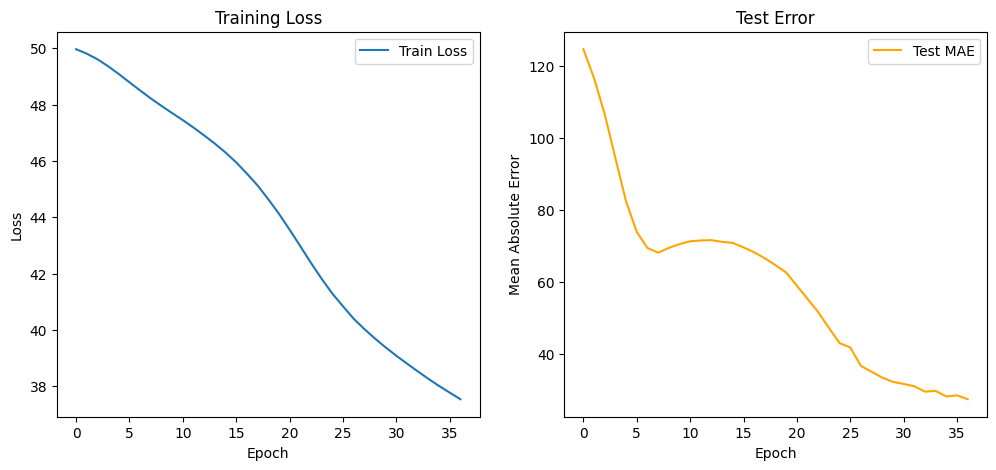

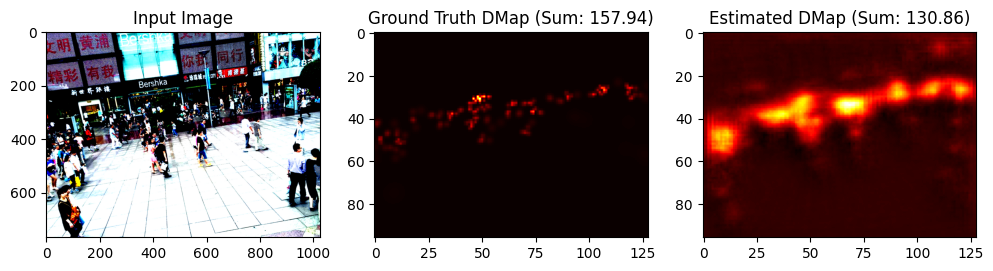

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.32it/s]


Epoch: 37 | Train Loss: 37.29 | Test MAE: 27.32


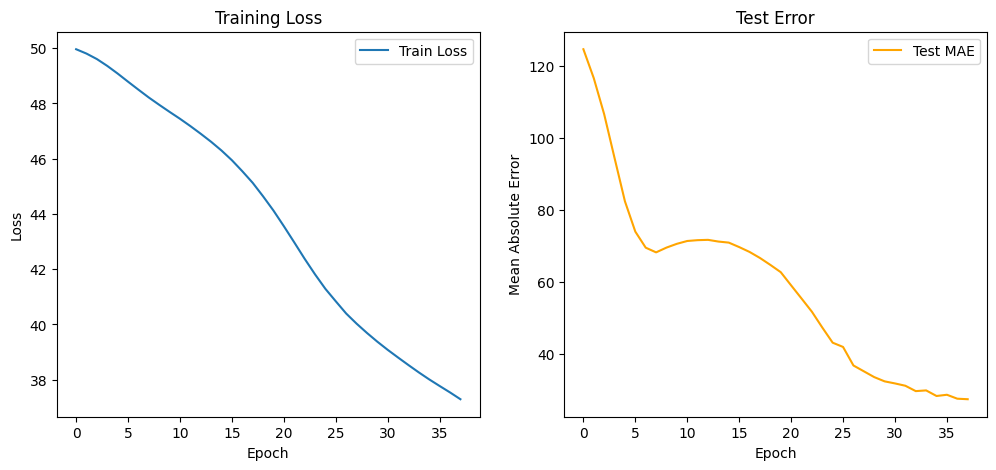

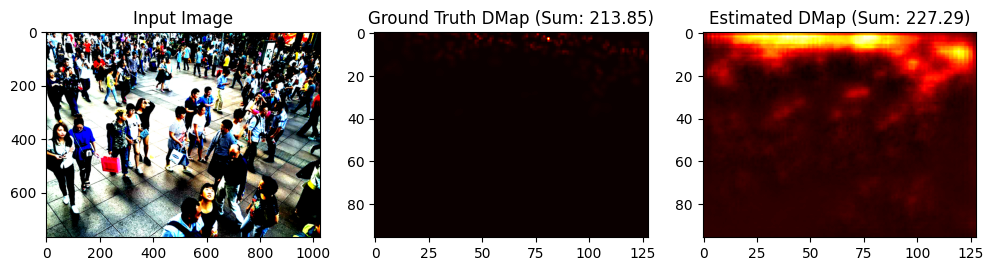

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.34it/s]


Epoch: 38 | Train Loss: 37.10 | Test MAE: 27.03


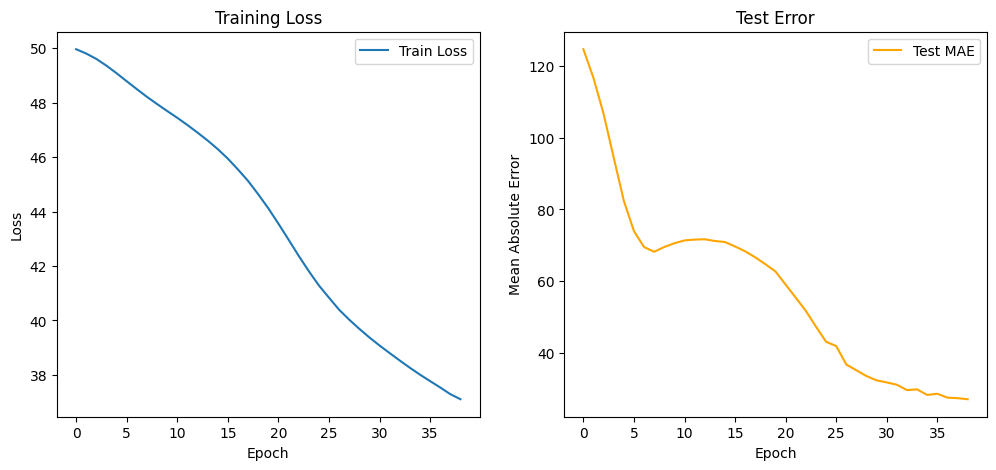

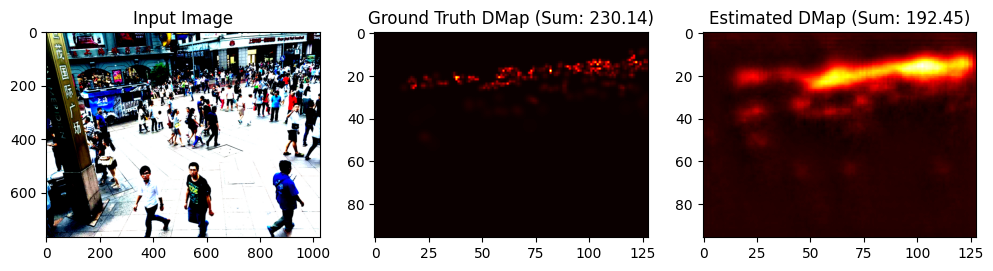

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.29it/s]


Epoch: 39 | Train Loss: 36.88 | Test MAE: 26.80


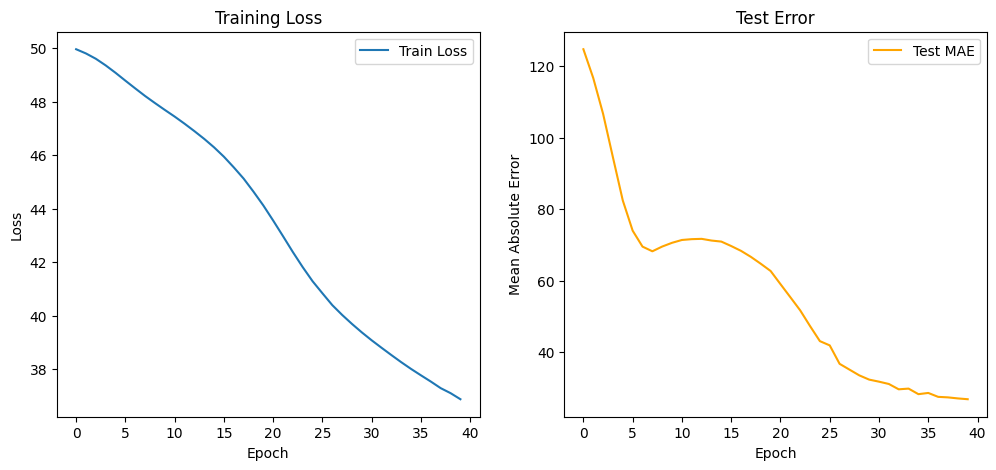

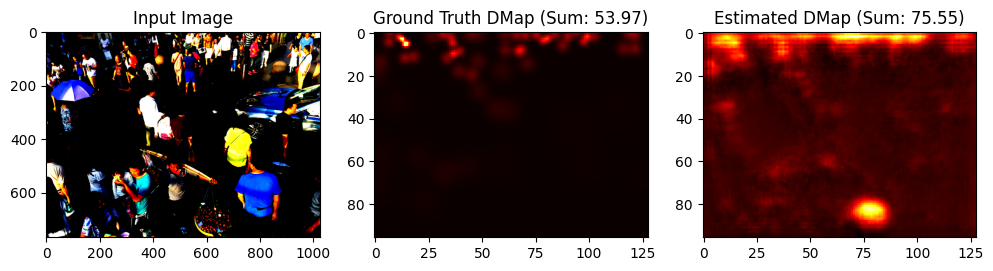

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.22it/s]


Epoch: 40 | Train Loss: 36.69 | Test MAE: 26.87


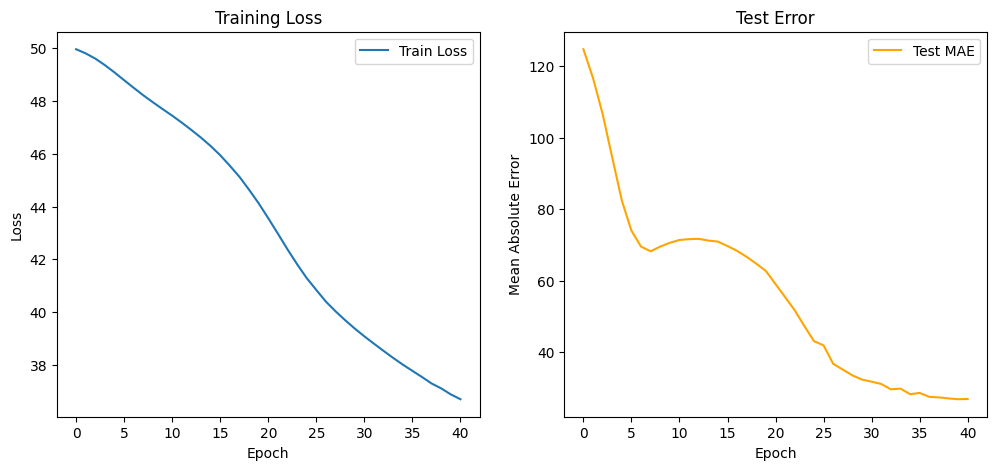

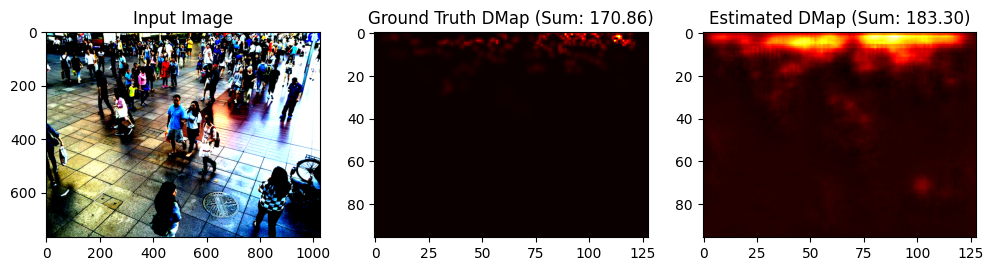

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.32it/s]


Epoch: 41 | Train Loss: 36.52 | Test MAE: 26.44


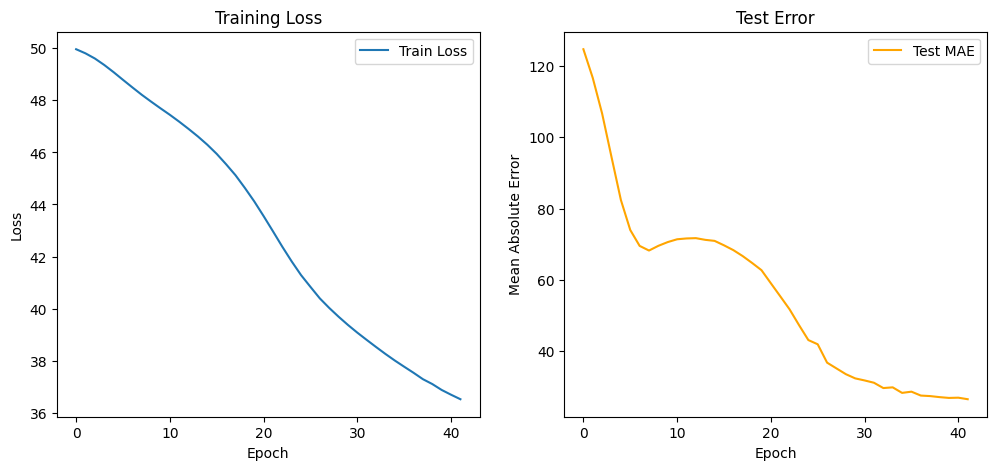

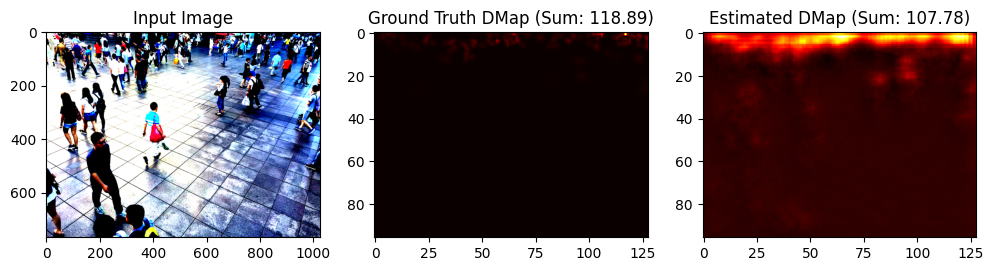

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.29it/s]


Epoch: 42 | Train Loss: 36.35 | Test MAE: 29.27


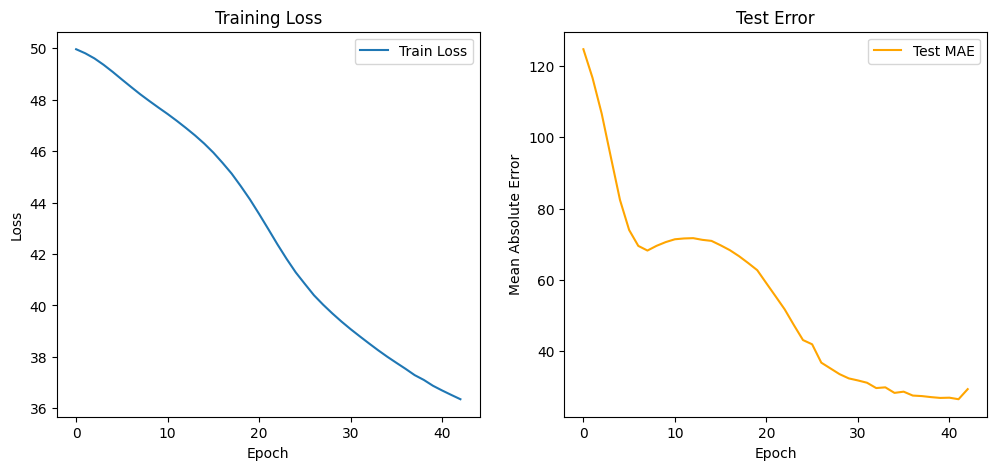

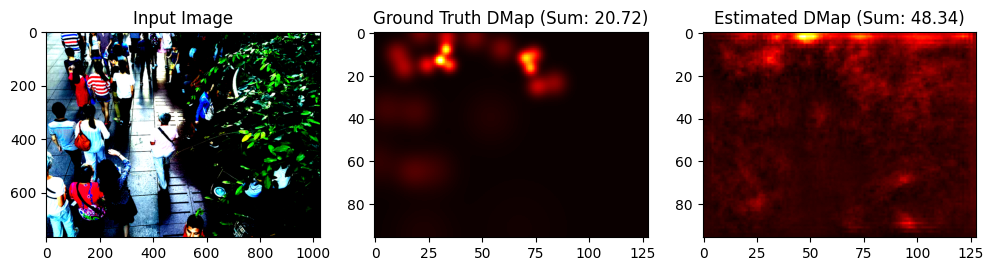

Testing: 100%|██████████| 100/100 [00:23<00:00,  4.27it/s]


Epoch: 43 | Train Loss: 36.18 | Test MAE: 27.08


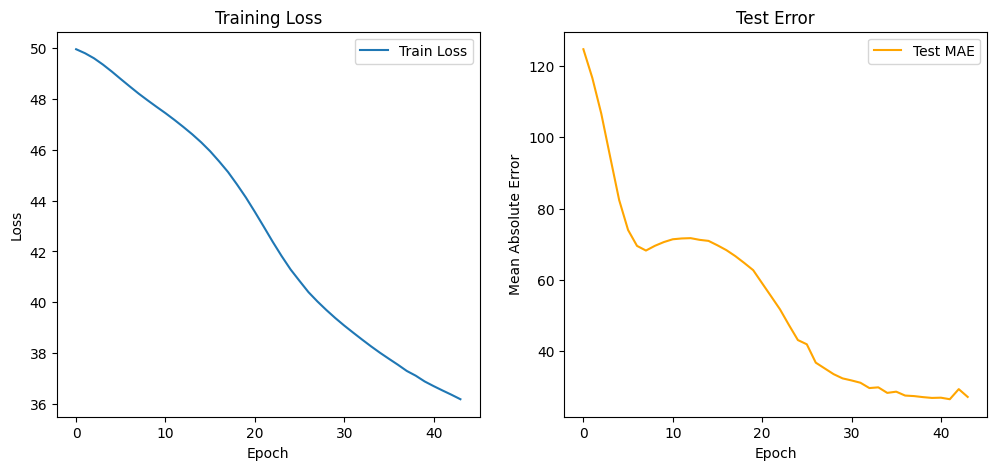

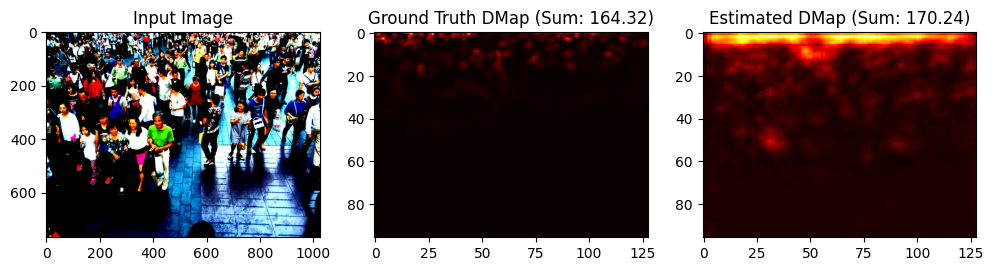

Testing: 100%|██████████| 100/100 [00:24<00:00,  4.13it/s]


Epoch: 44 | Train Loss: 35.98 | Test MAE: 26.24


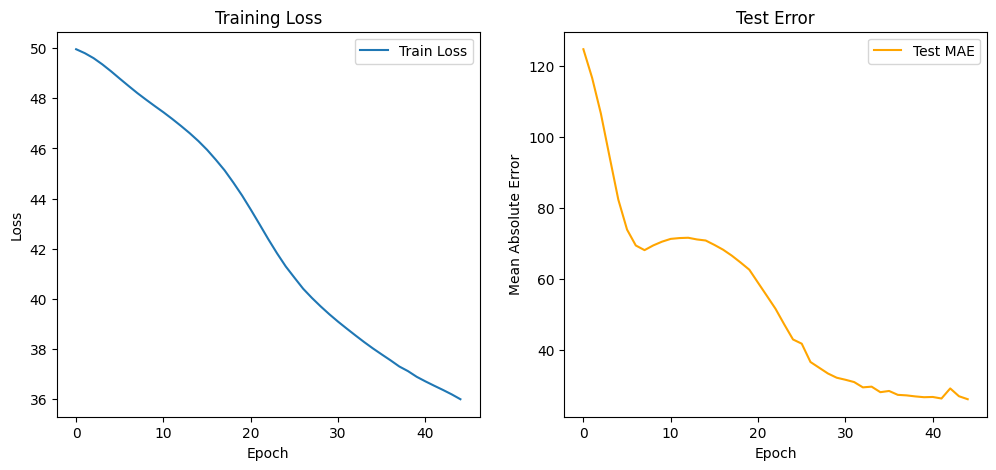

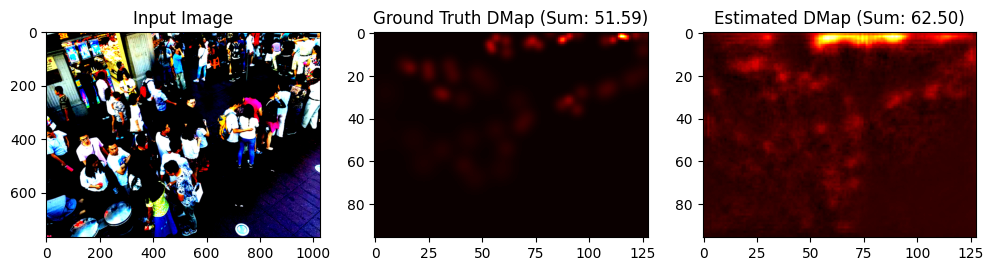

Training complete.
Minimum MAE achieved: 26.24 at epoch 44
2024.11.04 08:29:24


In [ ]:
def main():
    setup_seed(SEED)
    model, criterion, optimizer = initialize_model()
    train_loader, test_loader = prepare_data()

    min_mae = float('inf')
    min_epoch = 0
    train_loss_list, epoch_list, test_error_list = [], [], []

    for epoch in range(EPOCHS):
        train_loss = train_one_epoch(model, train_loader, criterion, optimizer)
        test_mae = evaluate(model, test_loader)

        epoch_list.append(epoch)
        train_loss_list.append(train_loss)
        test_error_list.append(test_mae)

        print(f"Epoch: {epoch} | Train Loss: {train_loss:.2f} | Test MAE: {test_mae:.2f}")

        if test_mae < min_mae:
            min_mae = test_mae
            min_epoch = epoch

        plot_metrics(epoch_list, train_loss_list, test_error_list)

        save_checkpoint(model, epoch)
        display_sample(model, test_loader.dataset)

    print("Training complete.")
    print(f"Minimum MAE achieved: {min_mae:.2f} at epoch {min_epoch}")
    print(time.strftime('%Y.%m.%d %H:%M:%S', time.localtime(time.time())))

if __name__ == "__main__":
    main()

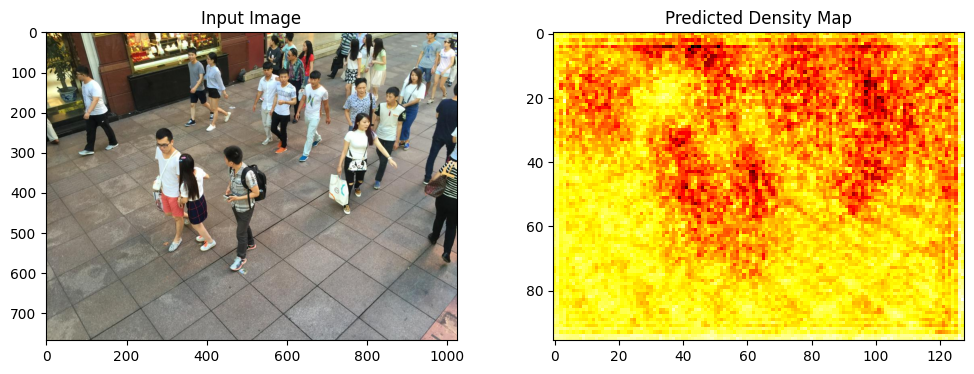

In [ ]:
im1 = '/content/drive/MyDrive/reduced_part_B/test_data/images/IMG_1.jpg'
img = plt.imread(im1) / 255
img_tensor = torch.tensor(img, dtype=torch.float).permute(2, 0, 1).unsqueeze(0).to(DEVICE)

with torch.no_grad():
    et_dmap = model(img_tensor)

et_dmap_np = et_dmap.squeeze(0).squeeze(0).cpu().numpy()

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Input Image')

plt.subplot(1, 2, 2)
plt.imshow(et_dmap_np, cmap='hot')
plt.title('Predicted Density Map')

plt.show()

Average Density: 5.94
Maximum Density: 19.25
High-Density Area Coverage: 15.01%


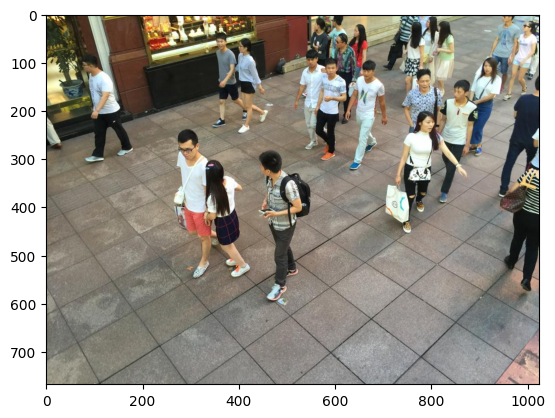

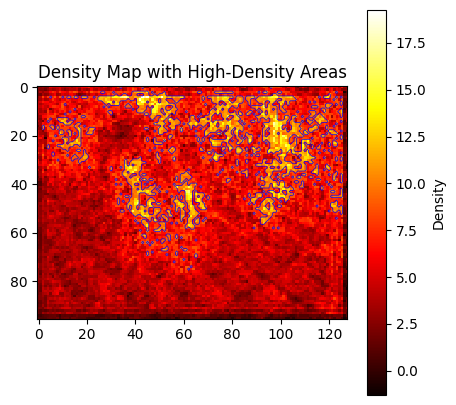

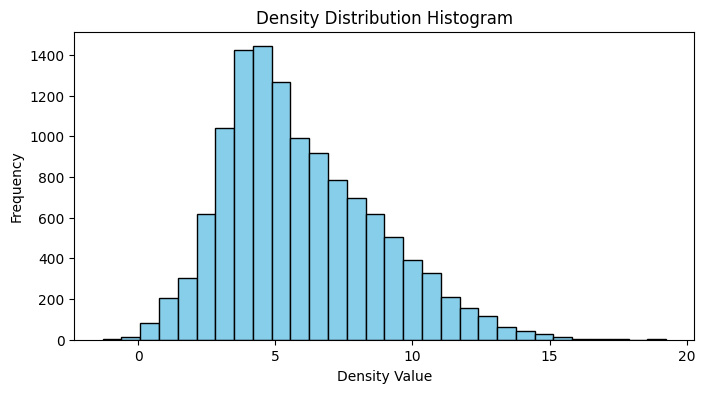

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

density_map = et_dmap_np * -1e4

average_density = np.mean(density_map)
print(f"Average Density: {average_density:.2f}")

max_density = np.max(density_map)
print(f"Maximum Density: {max_density:.2f}")

threshold = np.percentile(density_map, 85)
high_density_area = density_map > threshold
high_density_coverage = np.sum(high_density_area) / density_map.size * 100
print(f"High-Density Area Coverage: {high_density_coverage:.2f}%")
plt.imshow(img)

plt.figure(figsize=(5, 5))
plt.imshow(density_map, cmap='hot', interpolation='nearest')
plt.colorbar(label="Density")
plt.title("Density Map with High-Density Areas")

plt.contour(high_density_area, colors='blue', linewidths=0.5)
plt.show()

plt.figure(figsize=(8, 4))
plt.hist(density_map.flatten(), bins=30, color='skyblue', edgecolor='black')
plt.title("Density Distribution Histogram")
plt.xlabel("Density Value")
plt.ylabel("Frequency")
plt.show()
